**Bayesian Optimisation for hyperparameter configuration**

**Set random seed for reproducability**

In [1]:
import os
import numpy as np 
import tensorflow as tf
randseed = 42
np.random.seed(randseed)
tf.random.set_seed(randseed)
os.environ['PYTHONHASHSEED']=str(randseed)

**Import packages**

In [2]:
import pandas as pd 
import matplotlib.pyplot as plt 
from keras import backend as K
from keras.models import Sequential, load_model 
from keras.layers import Dense, Dropout, LSTM 
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler  
from sklearn.metrics import  mean_squared_error, mean_absolute_error, r2_score
import skopt
from skopt import gp_minimize
from skopt.utils import use_named_args
from skopt.space import Real, Categorical, Integer

**Read in dataset**

In [3]:
#Read in the Dataset
original = pd.read_csv('/kaggle/input/stocks/BVT.csv') 
original['Date'] = pd.to_datetime(original.Date) 
original.head()

,Date,Open,High,Low,Close,Volume,Earnings Yield (EY),Dividend Yield (DY),P:E Ratio (P:E),Trades,Trade Value,Total Return Index (TRI)
0,1999-01-01,1198,1199,1197,1198,0,15.327,1.069296,6.524434,-,-,578.406132
1,1999-01-04,1178,1178,1163,1164,181317,16.039,1.069296,6.234803,-,-,561.990599
2,1999-01-05,1164,1170,1162,1166,313064,16.039,1.069296,6.234803,-,-,562.956219
3,1999-01-06,1170,1257,1170,1234,590466,14.970,1.069296,6.680027,-,-,595.787285
4,1999-01-07,1255,1282,1255,1268,305378,14.614,1.069296,6.842754,-,-,612.202818


**Feature Engineering:**

*   Variations of Log Returns
*   Total Return Index (TRI)
*   Simple Moving Average (SMA) - 20, 50, 200 days
*   Exponentially-weighted Moving Average (EWMA) - 20, 50, 200 days
*   Moving Average Convergence Divergence (MACD)
*   Relative Strength Index (RSI) - 14 days
*   Moving Average Convergence Divergence (MACD)

In [4]:
forecastHorizon = 5

#Create new dataframe
df = pd.DataFrame(data = original['Date'])  

#Target Returns (Weekly)
df['Target'] = np.log(original['Close'].shift(-forecastHorizon) / original['Close'])

#Returns from the closing price
df['Returns'] = np.log((original['Close']) / original['Close'].shift(forecastHorizon))

#Lagged Variations of returns
df['Returns1'] = np.log((original['Close']) / original['Close'].shift(1))
df['Returns2'] = np.log((original['Close']) / original['Close'].shift(2))
df['Returns3'] = np.log((original['Close']) / original['Close'].shift(3))
df['Returns4'] = np.log((original['Close']) / original['Close'].shift(4))

#Simple Moving Average (SMA) and Exponentially-weighted Moving Average (EWMA) - 5, 10, 20, 50, 200 days
numDays = 5
df['SMA (5)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (5)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 10
df['SMA (10)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (10)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 20
df['SMA (20)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (20)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 50
df['SMA (50)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (50)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 200
df['SMA (200)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (200)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

#Relative Strength Index (RSI)
numDays = 14
diff = original['Close'].diff(1)
up, down = diff.copy(), diff.copy()
up[up < 0] = 0
down[down > 0] = 0
EWMAu = up.ewm(span = numDays, min_periods = numDays).mean()
EWMAd = down.abs().ewm(span = numDays, min_periods = numDays).mean()
RS = EWMAu / EWMAd
df['RSI'] = 100.0 - (100.0 / (1.0 + RS))

#Moving Average Convergence Divergence (MACD)
df['MACD'] = df['Returns'].ewm(span = 12, min_periods = 12).mean()  - df['Returns'].ewm(span = 26, min_periods = 26).mean() 

#Commodity Channel Index (CCI) 
df['Typical Price'] = (original['High'] + original['Low'] + original['Close']) / 3
numDays = 20
df['CCI'] = (df['Typical Price'] - df['Typical Price'].rolling(numDays).mean()) / (0.015 * df['Typical Price'].rolling(numDays).std())

#Stochastic Oscillator (SO)
numDays = 14
df['SO'] = ((df['Returns'] - df['Returns'].rolling(numDays).min()) / (df['Returns'].rolling(numDays).max() - df['Returns'].rolling(numDays).min())) * 100

#Variations of Returns
df['TRI'] = np.log(original['Total Return Index (TRI)'] / original['Total Return Index (TRI)'].shift(forecastHorizon))
df['Returns Open'] = np.log(original['Open'] / original['Open'].shift(forecastHorizon))
df['Returns Low'] = np.log(original['Low'] / original['Low'].shift(forecastHorizon))
df['Returns High'] = np.log(original['High'] / original['High'].shift(forecastHorizon))
df['Returns High/Open'] = np.log(original['High'] / original['Open'].shift(forecastHorizon))
df['Returns High/Low'] = np.log(original['High'] / original['Low'].shift(forecastHorizon))
df['Returns High/Close'] = np.log(original['High'] / original['Close'].shift(forecastHorizon))
df['Returns Close/Open'] = np.log(original['Close'] / original['Open'].shift(forecastHorizon))
df['Returns Close/Low'] = np.log(original['Close'] / original['Low'].shift(forecastHorizon))
df['Returns Close/High'] = np.log(original['Close'] / original['High'].shift(forecastHorizon))
df['Returns Open/Low'] = np.log(original['Open'] / original['Low'].shift(forecastHorizon))
df['Typical Price'] = np.log(df['Typical Price'] / df['Typical Price'].shift(forecastHorizon))

#Set date to index
df.index = df['Date'] 

#Drop columns that aren't needed
df.drop(['Date'], axis=1, inplace=True)

#Drop NaNs
df = df.dropna()

df.head()

,Target,Returns,Returns1,Returns2,Returns3,Returns4,SMA (5),EWMA (5),SMA (10),EWMA (10),...,Returns Open,Returns Low,Returns High,Returns High/Open,Returns High/Low,Returns High/Close,Returns Close/Open,Returns Close/Low,Returns Close/High,Returns Open/Low
Date,,,,,,,,,,,,,,,,,,,,,
1999-10-14,-0.044306,0.013738,0.001606,-0.015134,-0.022223,-0.019078,0.026688,0.030796,0.073713,0.041072,...,0.012131,-0.006579,0.014297,0.031240,0.038590,0.031240,0.013738,0.021088,-0.003205,0.019481
1999-10-15,0.053885,-0.094051,-0.074973,-0.073366,-0.090106,-0.097196,-0.002132,-0.010820,0.052829,0.016504,...,0.013738,-0.064207,-0.035479,0.013738,0.032629,-0.019078,-0.061235,-0.042343,-0.110451,0.032629
1999-10-18,0.081780,-0.102400,-0.005204,-0.080176,-0.078570,-0.095310,-0.029154,-0.041346,0.029340,-0.005115,...,-0.094051,-0.106243,-0.094371,-0.088874,-0.080969,-0.092019,-0.099255,-0.091350,-0.104752,-0.086146
1999-10-19,0.044306,-0.059440,0.035871,0.030667,-0.044306,-0.042699,-0.046004,-0.047378,0.009788,-0.014992,...,-0.102400,-0.091392,-0.061112,-0.054852,-0.034233,-0.047763,-0.066529,-0.045910,-0.072789,-0.081780
1999-10-20,0.021088,-0.019481,0.023218,0.059089,0.053885,-0.021088,-0.052327,-0.038079,-0.005084,-0.015808,...,-0.050706,-0.034945,-0.010421,-0.010421,0.014611,-0.002414,-0.027488,-0.002456,-0.027488,-0.025674


**Model Helper Functions**

In [5]:
def split(dataset, sequencelength, features, scaler, start, trainingSize, validationSize, testingSize, end):
  '''
  Function to split the data into a window required for Keras RNNs
  @params:
    dataset - data to be used
    sequencelength - Number of datapoints in a single input sequence
    features - Number of features in the dataset
    scaler - Initialised MinMaxScaler
    start - First datapoint index
    trainingSize - Size of the training set
    validationSize - Size of the validation set
    testingSize - Size of the testing set
    end - Last datapoint index
  @returns:
    scaler - Scaler that is fit on the training data
    x_train - Scaled Training input 
    y_train - Scaled Training output 
    y_trainUnscaled - Unscaled training output 
    x_val - Scaled validation input 
    y_val - Scaled validation output 
    y_valUnscaled - Unscaled validation output 
    x_test - Scaled testing input 
    y_test - Unscaled testing output 
  '''
  #Extracting target variables for the test and train set
  train = scaler.fit_transform(dataset[start - sequencelength : start + trainingSize, :])
  unscaled_train = dataset[start - sequencelength : start + trainingSize , 0]

  x_train = []
  y_train = []
  y_trainUnscaled = []
  for i in range(sequencelength, len(train)):
    x_train.append(train[i - sequencelength + 1 : i + 1, 1:])
    y_train.append(train[i, 0])
    y_trainUnscaled.append(unscaled_train[i])

  x_train = np.array(x_train)
  x_train = x_train.reshape((x_train.shape[0], sequencelength, features))
  y_train = np.array(y_train)
  y_trainUnscaled = np.array(y_trainUnscaled)

  #Splitting the validation set into input and output arrays
  val = scaler.transform(dataset[start + trainingSize - sequencelength : end - testingSize, :])
  unscaled_val = dataset[start + trainingSize - sequencelength : end - testingSize , 0]

  x_val = []
  y_val = []
  y_valUnscaled = []
  for i in range(sequencelength, len(val)):
    x_val.append(val[i - sequencelength + 1 : i + 1, 1:])
    y_val.append(val[i, 0])
    y_valUnscaled.append(unscaled_val[i])

  x_val = np.array(x_val)
  x_val = x_val.reshape((x_val.shape[0], sequencelength, features))
  y_val = np.array(y_val)
  y_valUnscaled = np.array(y_valUnscaled)

  #Splitting the testing set into input an array
  test = scaler.transform(dataset[start + trainingSize + validationSize - sequencelength : end, :])
  unscaled_test = dataset[start + trainingSize + validationSize - sequencelength : end, 0]

  x_test = []
  y_test = []
  for i in range(sequencelength, len(test)):
    x_test.append(test[i - sequencelength + 1 : i + 1, 1:])
    y_test.append(unscaled_test[i])

  x_test = np.array(x_test) 
  x_test = x_test.reshape((x_test.shape[0], sequencelength, features))
  y_test = np.array(y_test)

  return scaler, x_train, y_train, y_trainUnscaled, x_val, y_val, y_valUnscaled, x_test, y_test

def makePredictions(model, x_train, x_val, x_test, sequencelength, scaler):
  '''
  Performs inference using the model
  @params:
    model - LSTM or GRU (Keras Framework)
    x_train - Training input data
    x_val - Validation input data
    x_test - Testing input data
    sequencelength - Input sequence length
    scaler - MinMaxScaler used to scale the data
  @returns:
    trainingPredictions - Training set predictions
    valPredictions - Validation set predictions
    testingPredictions - Testing set predictions
  '''
  #Forecasts on training set
  temp = x_train
  trainingPredictions = model.predict(x_train)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((trainingPredictions, temp[:,:features]), axis=1)
  trainingPredictions = scaler.inverse_transform(invPred)[:,0]
  trainingPredictions = trainingPredictions.reshape((trainingPredictions.shape[0], 1))

  #Forecasts on validation set
  temp = x_val
  valPredictions = model.predict(x_val)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((valPredictions, temp[:,:features]), axis=1)
  valPredictions = scaler.inverse_transform(invPred)[:,0]
  valPredictions = valPredictions.reshape((valPredictions.shape[0], 1))

  #Forecasts on test set
  temp = x_test
  testingPredictions = model.predict(x_test)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((testingPredictions, temp[:,:features]), axis=1)
  testingPredictions = scaler.inverse_transform(invPred)[:,0]
  testingPredictions = testingPredictions.reshape((testingPredictions.shape[0], 1))

  return trainingPredictions, valPredictions, testingPredictions

**Parameters for the dataset split**

In [6]:
dataset = df.values
totaldatapoints = len(dataset)
features = len(df.columns) - 1

**Setting up hyperparameter ranges**

In [7]:
dim_learning_rate = Real(low=1e-4, high=1e-2, prior='log-uniform', name='learning_rate')
dim_num_input_nodes = Integer(low=5, high=256, name='num_input_nodes')
dim_dropout = Real(low=0.0,high=0.25,name='dropout')
dim_sequence_length = Integer(low=100, high=200, name='sequence_length')
dim_batch_size = Integer(low=1, high=250, name='batch_size')

dimensions = [dim_learning_rate,
              dim_num_input_nodes,
              dim_dropout,
              dim_sequence_length,
              dim_batch_size]

default_parameters = [3e-4, 256, 0.2, 200, 32]

**LSTM initialisation based on current set of hyperparameters**

In [8]:
def lstm(learning_rate, num_input_nodes, dropout, sequence_length):
  '''
  Create LSTM
  @params: 
    learning_rate - Adam learning rate
    num_input_nodes - Number of LSTM cells in the layers
    dropout - dropout regularisation
    sequence_length - Length of the input sequence length
  @returns:
    model - Compiled LSTM
  '''
  #Construct LSTM
  model = Sequential()
  model.add(LSTM(units=num_input_nodes, return_sequences=True, input_shape=(sequence_length, features)))
  model.add(LSTM(units=num_input_nodes, dropout=dropout))
  model.add(Dense(1))

  adam = Adam(lr=learning_rate, amsgrad=True)
  model.compile(optimizer=adam, loss='mae', metrics=['mse','mae','mape'])
  return model

**Train LSTM with current hyperparameters**

In [9]:
@use_named_args(dimensions=dimensions)
def fitness(learning_rate, num_input_nodes, dropout, sequence_length, batch_size):
  '''
  Used in the Bayesian Optimisation Procedure
  @params:
    learning_rate - Adam learning rate
    num_input_nodes - Number of GRU cells in the layers
    dropout - dropout regularisation
    sequence_length - Length of the input sequence length
    batch_size - Model batch size
  @returns:
    mse - Mean squared Error using current hyperparameters
  '''
  #Get train, val, test split
  #Window Variables
  start = 0 + sequence_length
  trainingSize = 1000
  validationSize = 100
  testingSize = 150
  end = start + trainingSize + validationSize + testingSize + sequence_length

  #Get Data split
  scaler = MinMaxScaler(feature_range=(-1, 1))
  scaler, x_train, y_train, y_trainUnscaled, x_val, y_val, y_valUnscaled, x_test, y_test = split(dataset, sequence_length, features, scaler, start, trainingSize, validationSize, testingSize, end)
  
  print()
  print('learning rate: {}'.format(learning_rate))
  print('num_input_nodes: {}'.format(num_input_nodes))
  print('dropout: {}'.format(dropout))
  print('sequence_length : {}'.format(sequence_length))
  print('batch_size: {}'.format(batch_size))
  print()

  model = lstm(learning_rate=learning_rate,
               num_input_nodes=num_input_nodes,
               dropout=dropout,
               sequence_length=sequence_length)
  
  es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=20)
  mc = ModelCheckpoint('./LSTM.h5', monitor='val_loss', mode='min', verbose=0, save_best_only=True)
  blackbox = model.fit(x_train, y_train,  batch_size=batch_size, epochs=150, verbose=0, validation_data = (x_val, y_val), callbacks=[es, mc])
  model = load_model('./LSTM.h5')
  
  _, _, testingPredictions = makePredictions(model, x_train, x_val, x_test, sequence_length, scaler)

  #Plot graph of forecasts
  testGraph = pd.DataFrame(df[start + trainingSize + validationSize : end])
  testGraph['Test Predictions'] = testingPredictions
  testGraph['Test Actual'] = y_test

  plt.figure(figsize=(16,8))
  plt.plot(testGraph['Test Actual'], label='True values')
  plt.plot(testGraph['Test Predictions'], label = 'Predicted Values')
  plt.title("Result")
  plt.legend(loc = 'best')
  plt.show()

  #Get mse on the test set
  mse = mean_squared_error(y_test, testingPredictions)

  # Print the classification accuracy.
  print()
  print("MSE: {}".format(mse))
  print()

  del model
  K.clear_session()
  tf.compat.v1.reset_default_graph()
  return mse

**Bayesian Optimisation**

Iteration No: 1 started. Evaluating function at provided point.

learning rate: 0.0003
num_input_nodes: 256
dropout: 0.2
sequence_length : 200
batch_size: 32



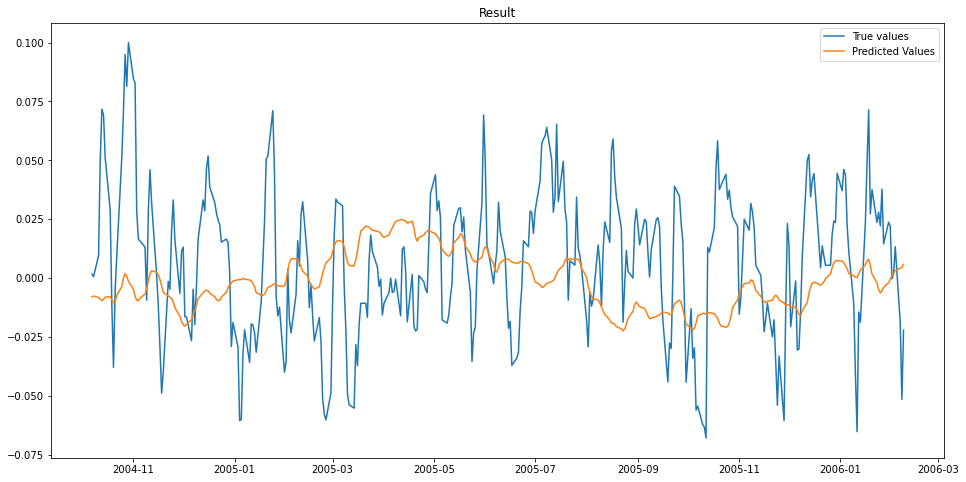


MSE: 0.0011599948481159778

Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 36.4770
Function value obtained: 0.0012
Current minimum: 0.0012
Iteration No: 2 started. Evaluating function at random point.

learning rate: 0.003918194347141745
num_input_nodes: 51
dropout: 0.19492275006819237
sequence_length : 160
batch_size: 112



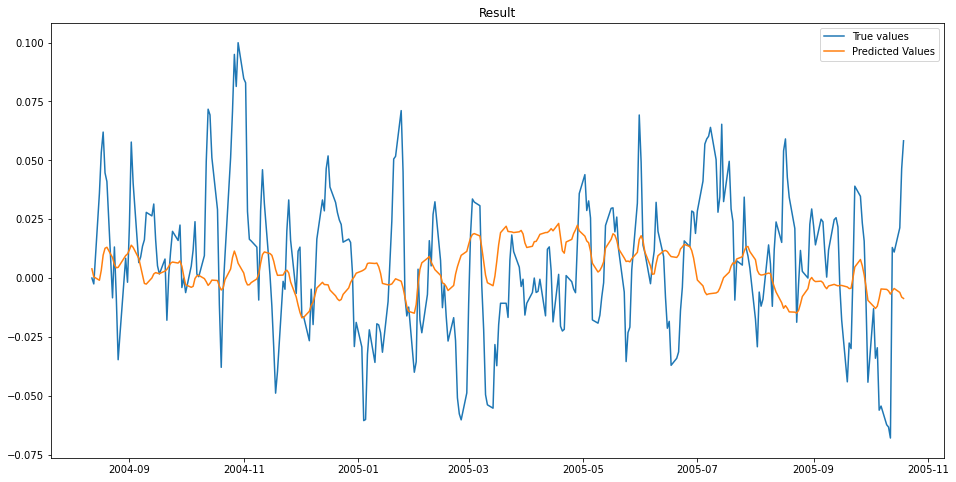


MSE: 0.0010013084804614803

Iteration No: 2 ended. Evaluation done at random point.
Time taken: 11.4290
Function value obtained: 0.0010
Current minimum: 0.0010
Iteration No: 3 started. Evaluating function at random point.

learning rate: 0.00015847101210439096
num_input_nodes: 120
dropout: 0.08342715278475547
sequence_length : 114
batch_size: 163



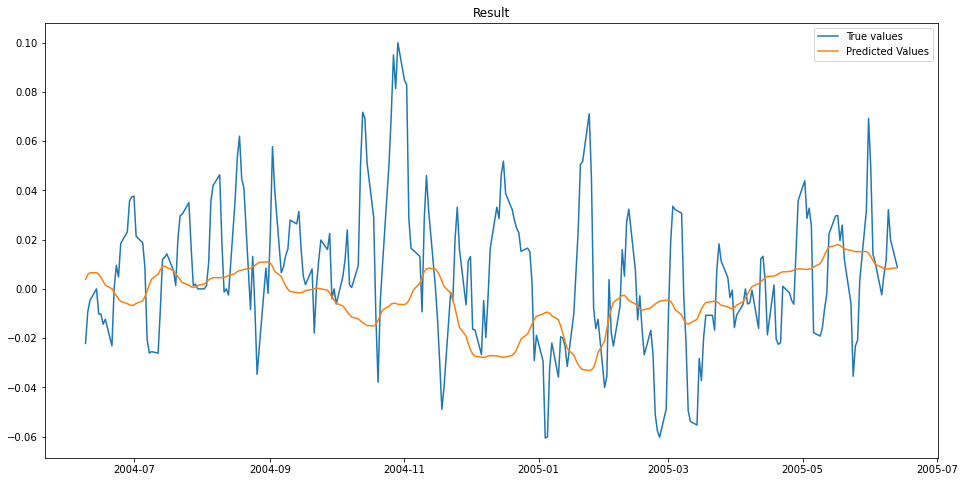


MSE: 0.0010527558062058745

Iteration No: 3 ended. Evaluation done at random point.
Time taken: 9.7377
Function value obtained: 0.0011
Current minimum: 0.0010
Iteration No: 4 started. Evaluating function at random point.

learning rate: 0.00012966511753760403
num_input_nodes: 186
dropout: 0.2346381772539376
sequence_length : 100
batch_size: 248



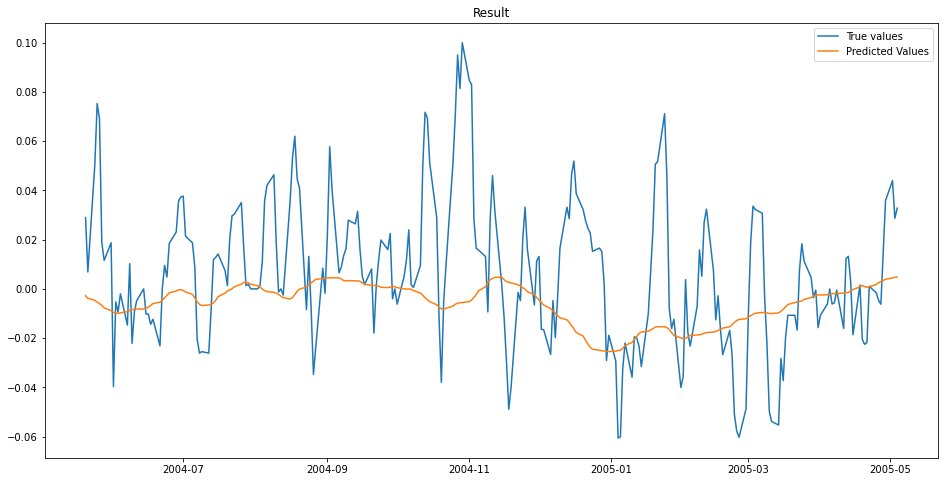


MSE: 0.000977353786685648

Iteration No: 4 ended. Evaluation done at random point.
Time taken: 10.5679
Function value obtained: 0.0010
Current minimum: 0.0010
Iteration No: 5 started. Evaluating function at random point.

learning rate: 0.0017177621112338384
num_input_nodes: 159
dropout: 0.001766576304929352
sequence_length : 102
batch_size: 132



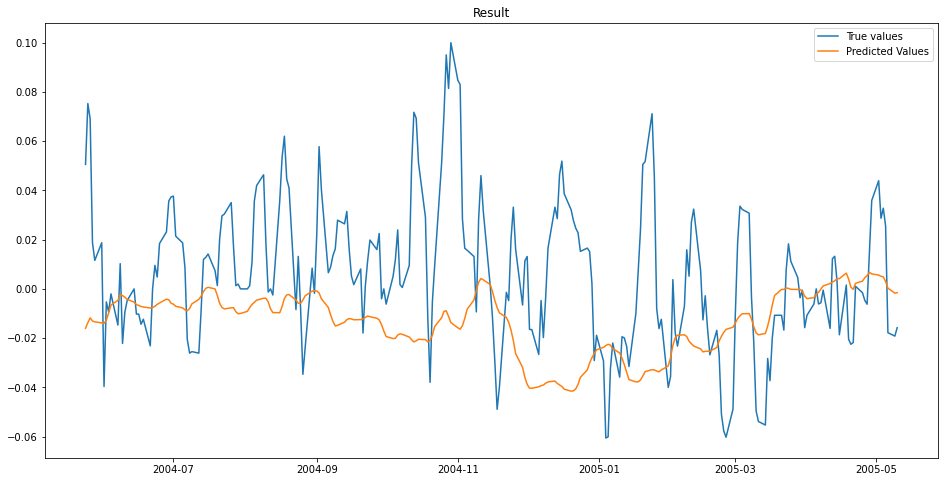


MSE: 0.0013796632331963521

Iteration No: 5 ended. Evaluation done at random point.
Time taken: 10.5276
Function value obtained: 0.0014
Current minimum: 0.0010
Iteration No: 6 started. Evaluating function at random point.

learning rate: 0.0006305535040199287
num_input_nodes: 17
dropout: 0.24343887971036485
sequence_length : 123
batch_size: 24



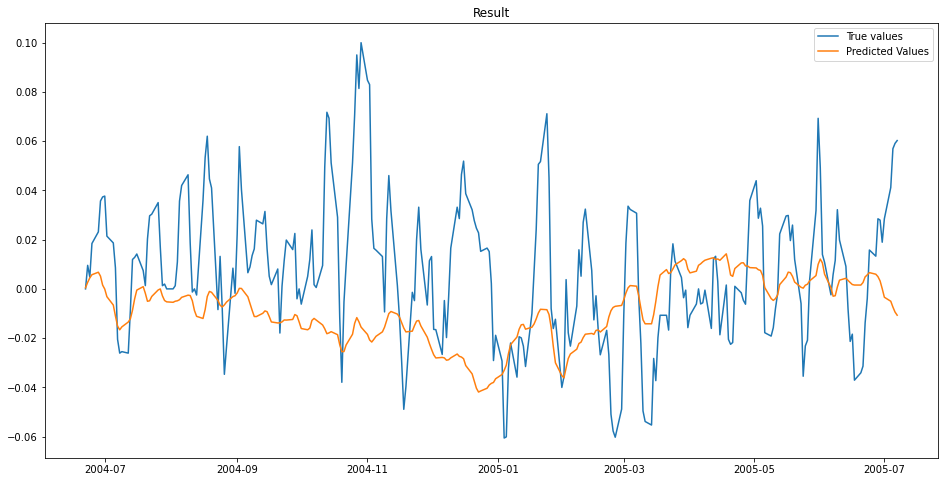


MSE: 0.0011977698427572143

Iteration No: 6 ended. Evaluation done at random point.
Time taken: 19.5690
Function value obtained: 0.0012
Current minimum: 0.0010
Iteration No: 7 started. Evaluating function at random point.

learning rate: 0.0017249321573178998
num_input_nodes: 101
dropout: 0.2458077214516971
sequence_length : 147
batch_size: 215



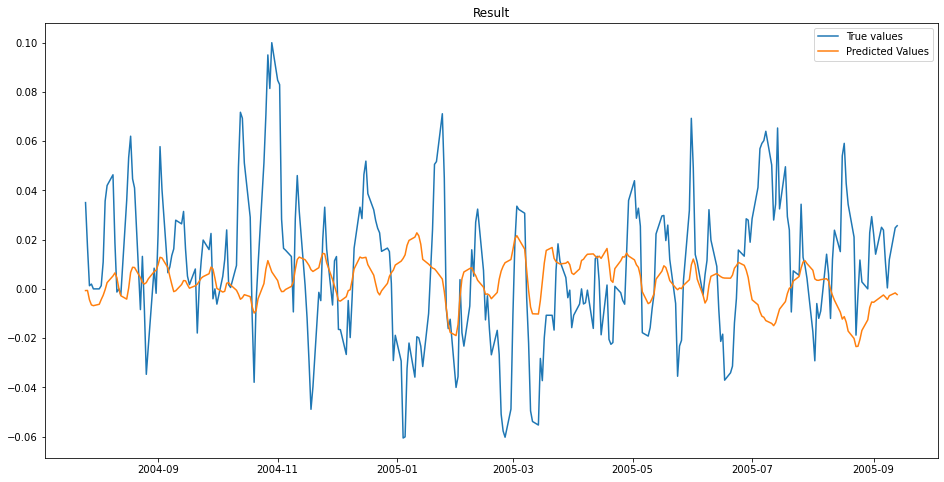


MSE: 0.0009696214694377844

Iteration No: 7 ended. Evaluation done at random point.
Time taken: 13.5608
Function value obtained: 0.0010
Current minimum: 0.0010
Iteration No: 8 started. Evaluating function at random point.

learning rate: 0.0022941144328643983
num_input_nodes: 118
dropout: 0.003316240289966633
sequence_length : 194
batch_size: 141



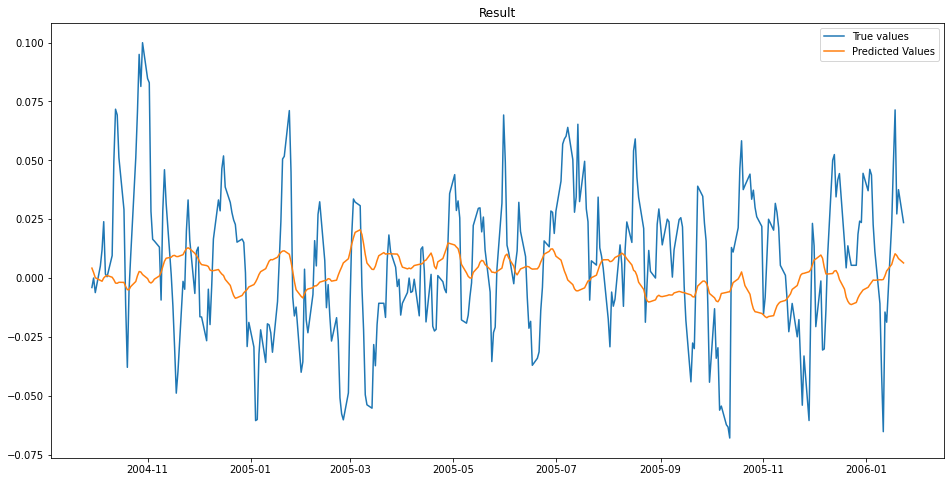


MSE: 0.0010212155392809574

Iteration No: 8 ended. Evaluation done at random point.
Time taken: 13.8750
Function value obtained: 0.0010
Current minimum: 0.0010
Iteration No: 9 started. Evaluating function at random point.

learning rate: 0.0005899741796710488
num_input_nodes: 9
dropout: 0.05772345640553726
sequence_length : 124
batch_size: 171



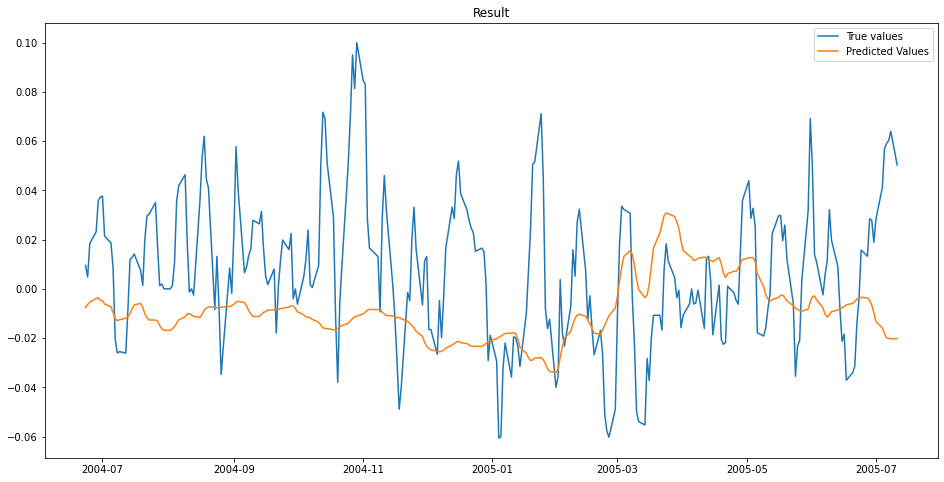


MSE: 0.0013115114968929855

Iteration No: 9 ended. Evaluation done at random point.
Time taken: 14.2414
Function value obtained: 0.0013
Current minimum: 0.0010
Iteration No: 10 started. Evaluating function at random point.

learning rate: 0.0016595613641357258
num_input_nodes: 214
dropout: 0.04334116337694303
sequence_length : 139
batch_size: 46



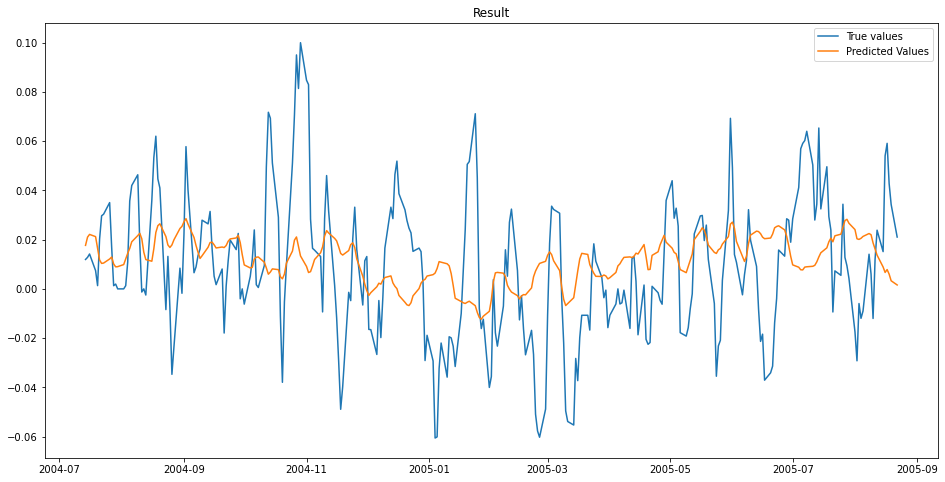


MSE: 0.000860733956256893

Iteration No: 10 ended. Evaluation done at random point.
Time taken: 20.2881
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 11 started. Evaluating function at random point.

learning rate: 0.0032413268041956303
num_input_nodes: 112
dropout: 0.05198541571704722
sequence_length : 157
batch_size: 9



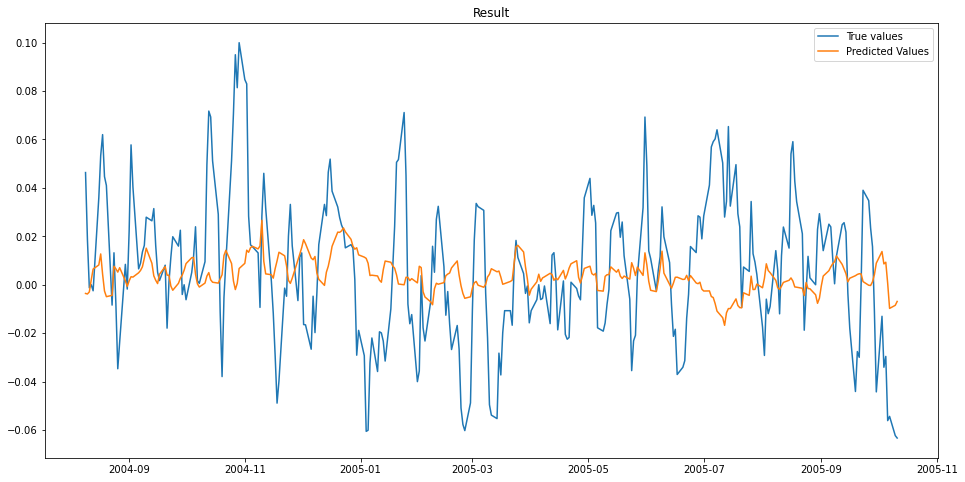


MSE: 0.0009693606893803778

Iteration No: 11 ended. Evaluation done at random point.
Time taken: 74.0152
Function value obtained: 0.0010
Current minimum: 0.0009
Iteration No: 12 started. Evaluating function at random point.

learning rate: 0.004836927180682221
num_input_nodes: 227
dropout: 0.18507824608274567
sequence_length : 163
batch_size: 20



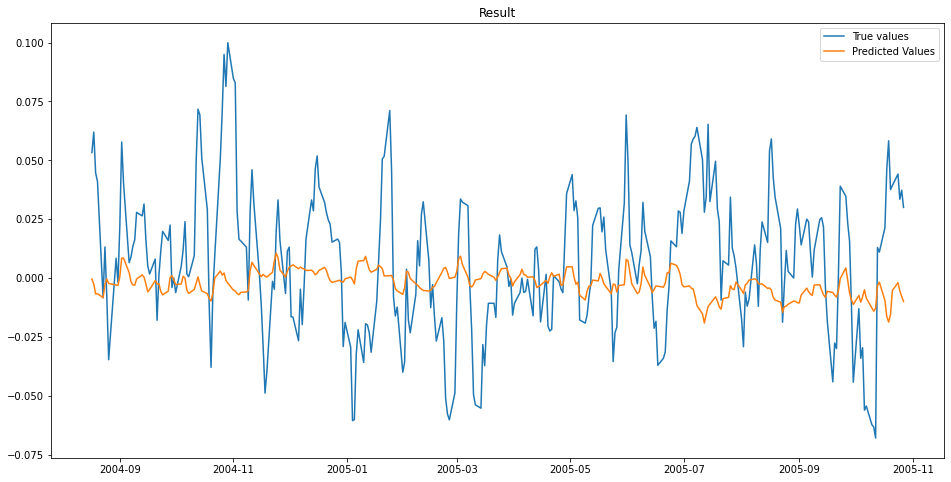


MSE: 0.0010431693583100364

Iteration No: 12 ended. Evaluation done at random point.
Time taken: 58.2528
Function value obtained: 0.0010
Current minimum: 0.0009
Iteration No: 13 started. Searching for the next optimal point.

learning rate: 0.0011055354209093056
num_input_nodes: 247
dropout: 0.23961521562344856
sequence_length : 105
batch_size: 66



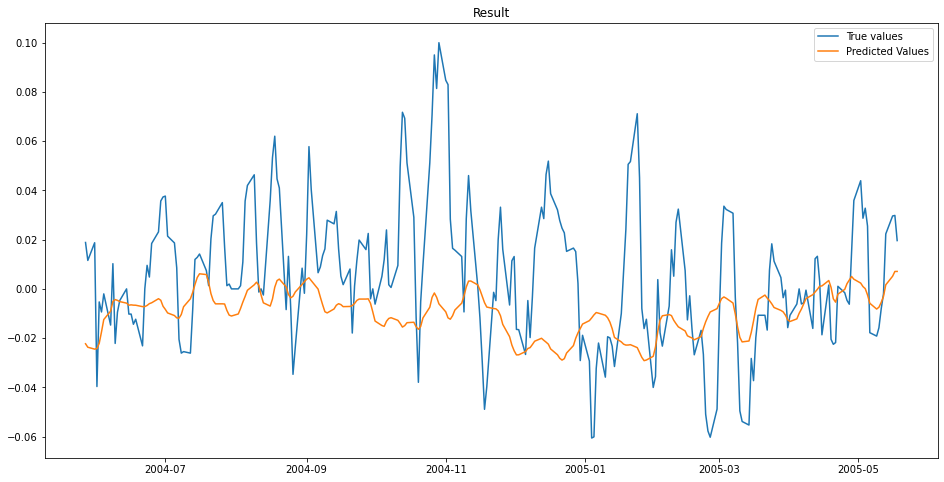


MSE: 0.00104490950017724

Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 18.0243
Function value obtained: 0.0010
Current minimum: 0.0009
Iteration No: 14 started. Searching for the next optimal point.

learning rate: 0.0002050670804560787
num_input_nodes: 240
dropout: 0.23434029225351388
sequence_length : 141
batch_size: 44



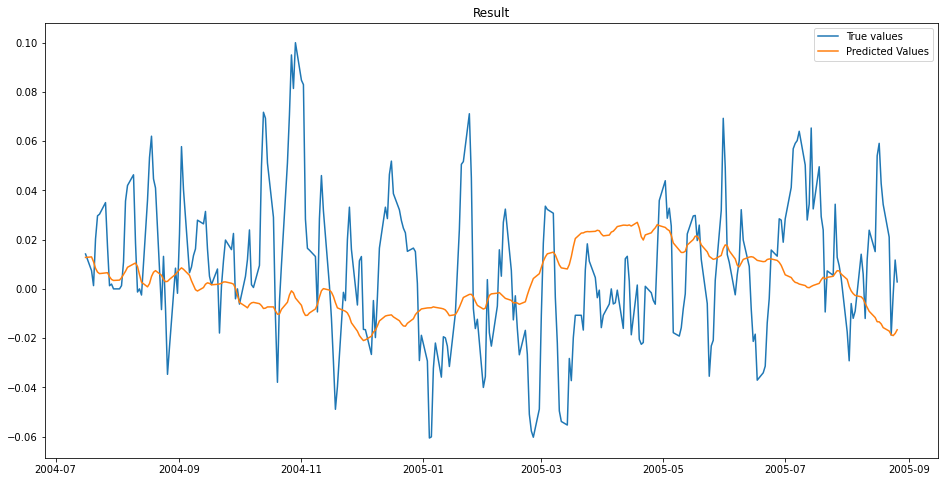


MSE: 0.0010629078488720819

Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 22.6285
Function value obtained: 0.0011
Current minimum: 0.0009
Iteration No: 15 started. Searching for the next optimal point.

learning rate: 0.00010993676976866407
num_input_nodes: 98
dropout: 0.19810399992331712
sequence_length : 151
batch_size: 140



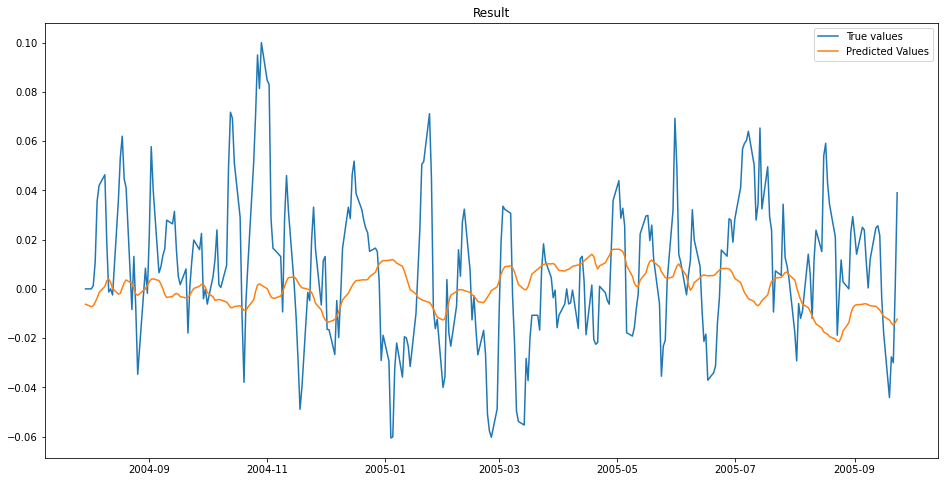


MSE: 0.0010080572135732226

Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 19.7394
Function value obtained: 0.0010
Current minimum: 0.0009
Iteration No: 16 started. Searching for the next optimal point.

learning rate: 0.0001040887456555644
num_input_nodes: 228
dropout: 0.1383620356395441
sequence_length : 150
batch_size: 41



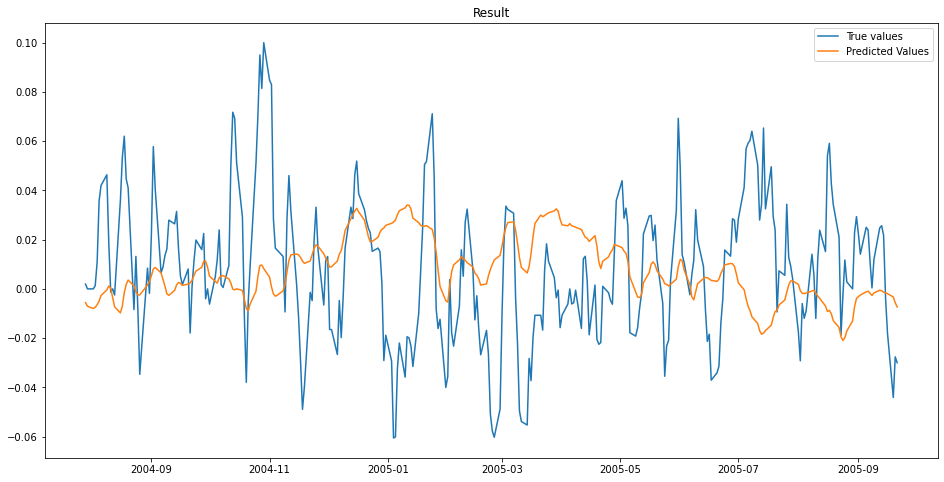


MSE: 0.0011100864413054175

Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 35.7116
Function value obtained: 0.0011
Current minimum: 0.0009
Iteration No: 17 started. Searching for the next optimal point.

learning rate: 0.0028432579235393727
num_input_nodes: 172
dropout: 0.006246422829997629
sequence_length : 198
batch_size: 119



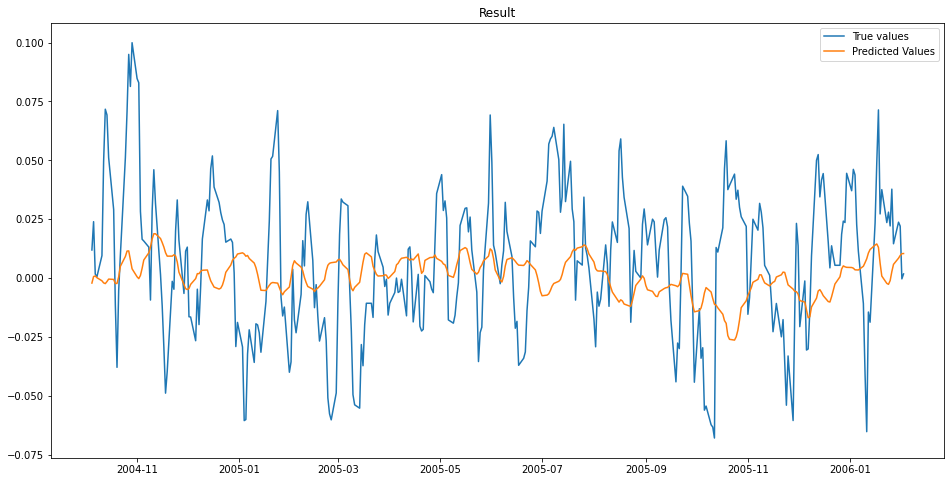


MSE: 0.0010615636334208335

Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 16.4983
Function value obtained: 0.0011
Current minimum: 0.0009
Iteration No: 18 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 203
dropout: 0.10640564637448868
sequence_length : 118
batch_size: 2



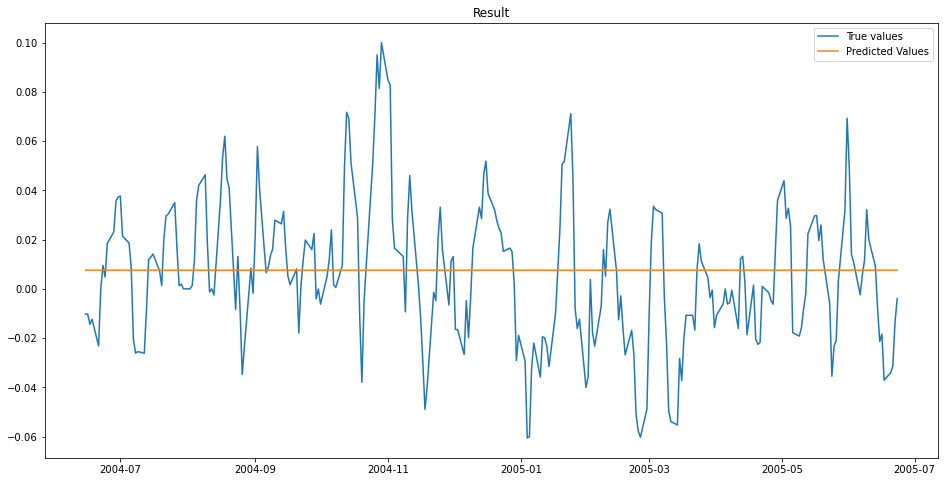


MSE: 0.0008282220225154805

Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 217.3881
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 19 started. Searching for the next optimal point.

learning rate: 0.0001
num_input_nodes: 206
dropout: 0.009871055437687256
sequence_length : 184
batch_size: 11



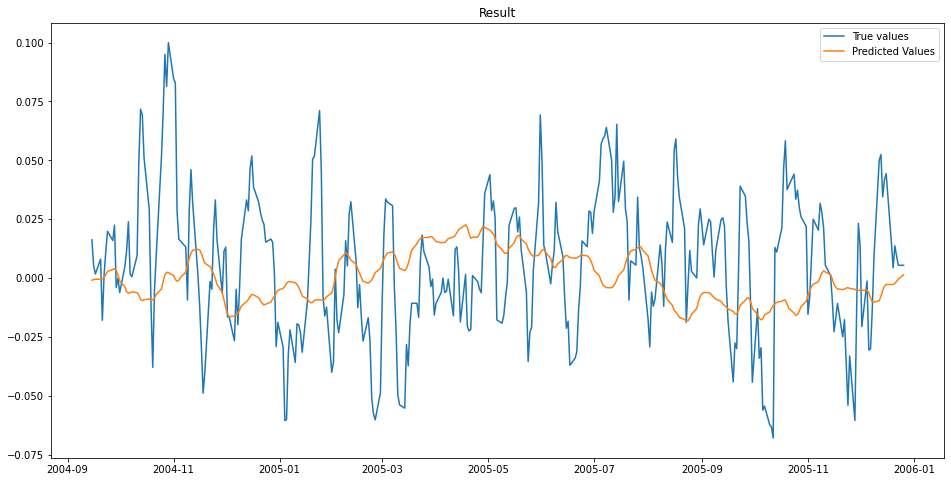


MSE: 0.0010771845115217472

Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 51.3637
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 20 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 213
dropout: 0.24876811140881808
sequence_length : 100
batch_size: 120



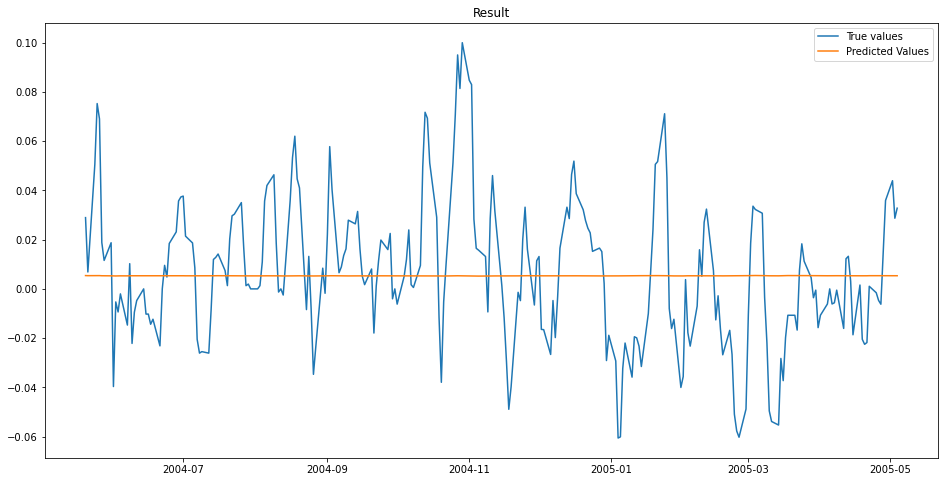


MSE: 0.0008597834798517903

Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 17.5813
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 21 started. Searching for the next optimal point.

learning rate: 0.0001
num_input_nodes: 205
dropout: 0.09597452032099109
sequence_length : 100
batch_size: 7



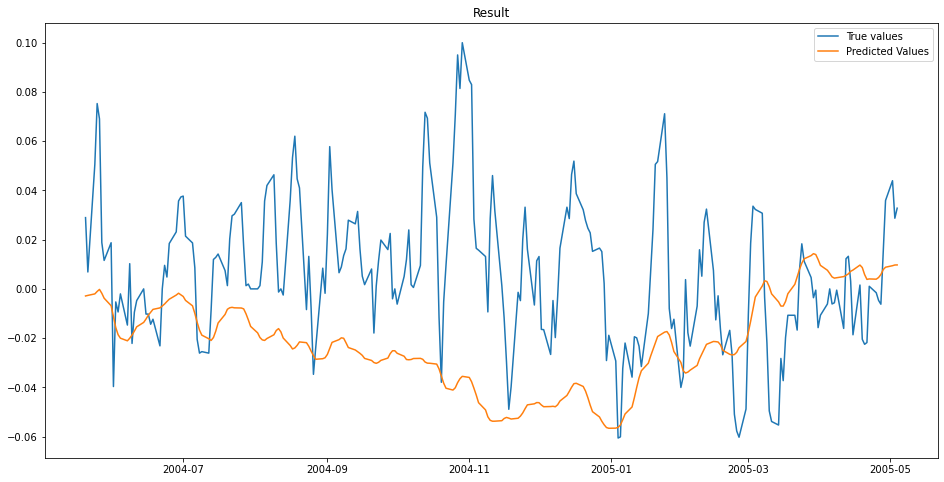


MSE: 0.002000130317229292

Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 45.1510
Function value obtained: 0.0020
Current minimum: 0.0008
Iteration No: 22 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 43
dropout: 0.24957251281911932
sequence_length : 187
batch_size: 250



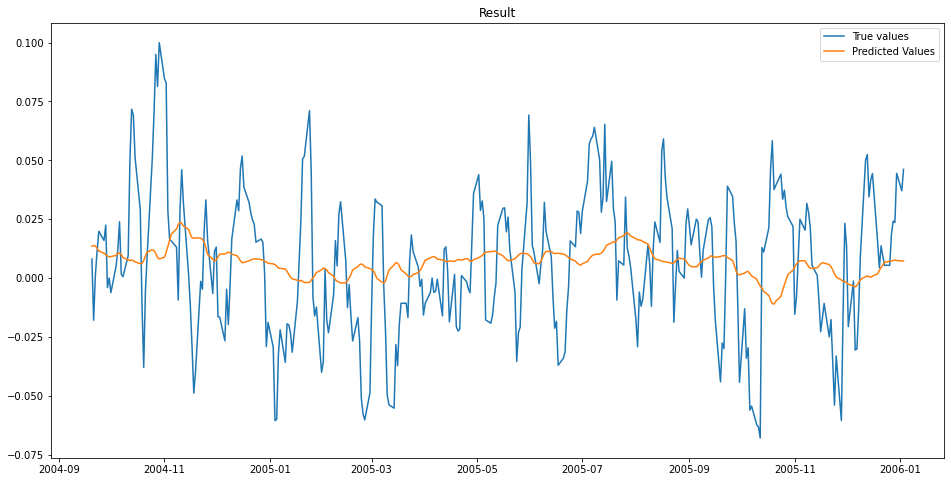


MSE: 0.0009278938167766519

Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 10.3654
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 23 started. Searching for the next optimal point.

learning rate: 0.00010500860220724178
num_input_nodes: 34
dropout: 0.13291366496345847
sequence_length : 197
batch_size: 241



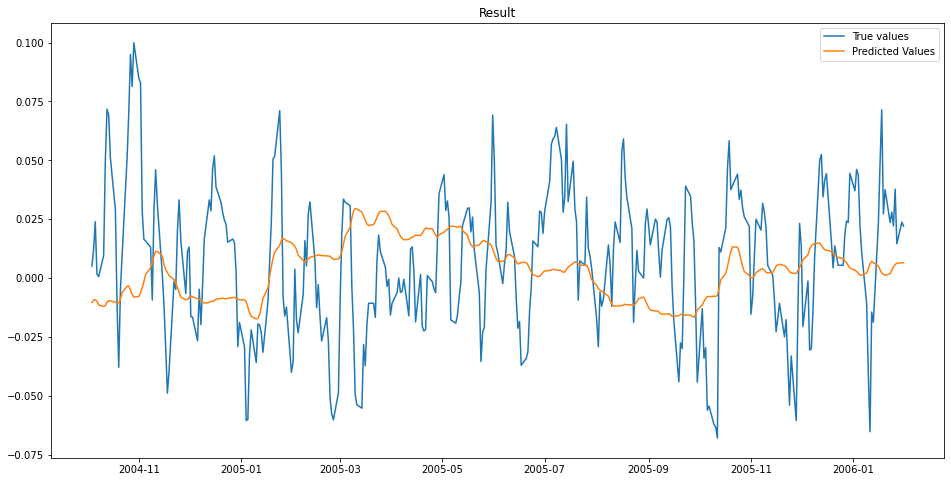


MSE: 0.0011479717905457255

Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 14.0832
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 24 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 229
dropout: 0.25
sequence_length : 100
batch_size: 52



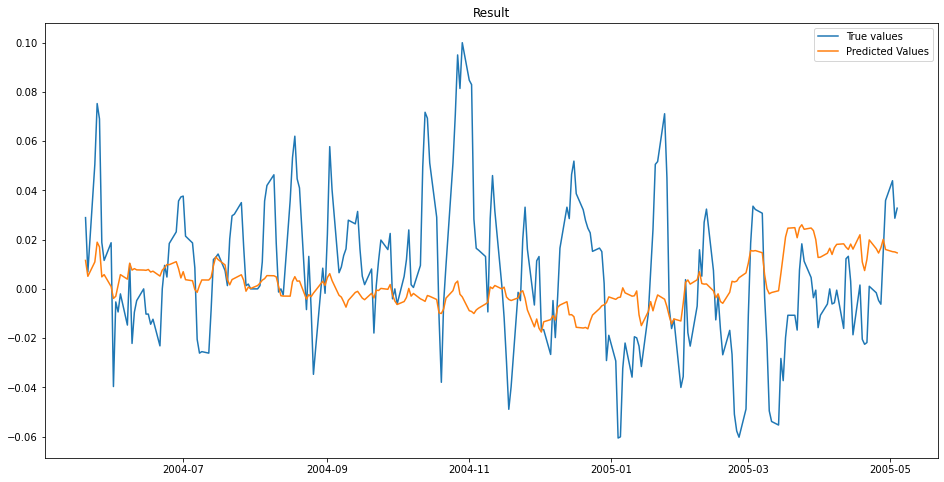


MSE: 0.0009610636810182815

Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 20.7630
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 25 started. Searching for the next optimal point.

learning rate: 0.0002858844098343165
num_input_nodes: 124
dropout: 0.19871927528155914
sequence_length : 112
batch_size: 17



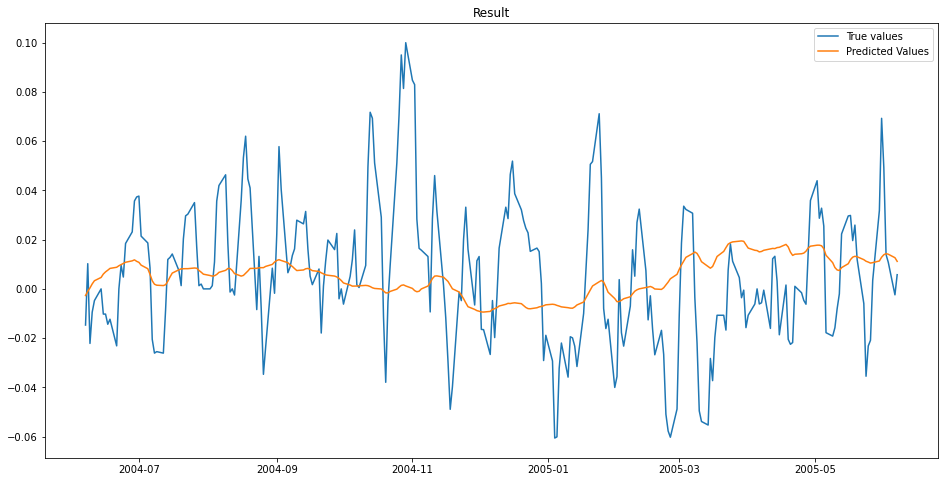


MSE: 0.0008545482025214662

Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 24.5387
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 26 started. Searching for the next optimal point.

learning rate: 0.001622566032593674
num_input_nodes: 131
dropout: 0.11103176700536782
sequence_length : 131
batch_size: 70



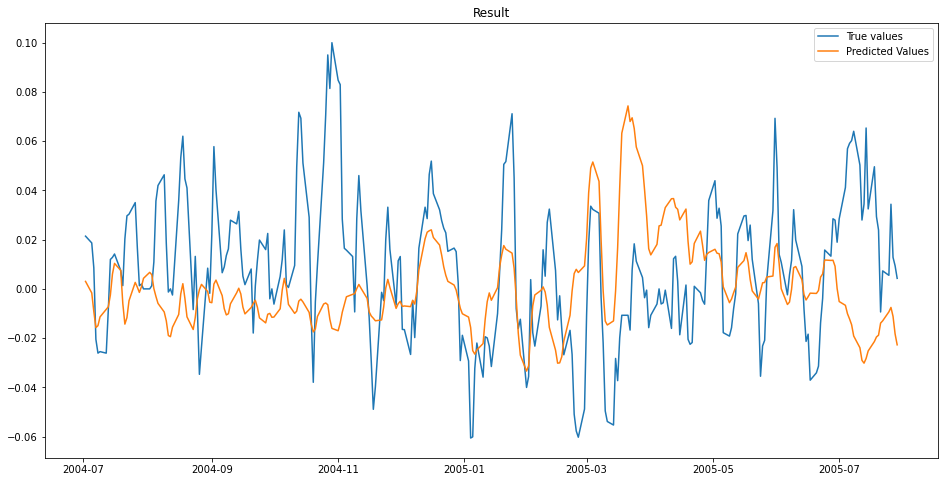


MSE: 0.0011769630724139623

Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 22.1220
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 27 started. Searching for the next optimal point.

learning rate: 0.00391989751341379
num_input_nodes: 67
dropout: 0.22209883733973426
sequence_length : 161
batch_size: 144



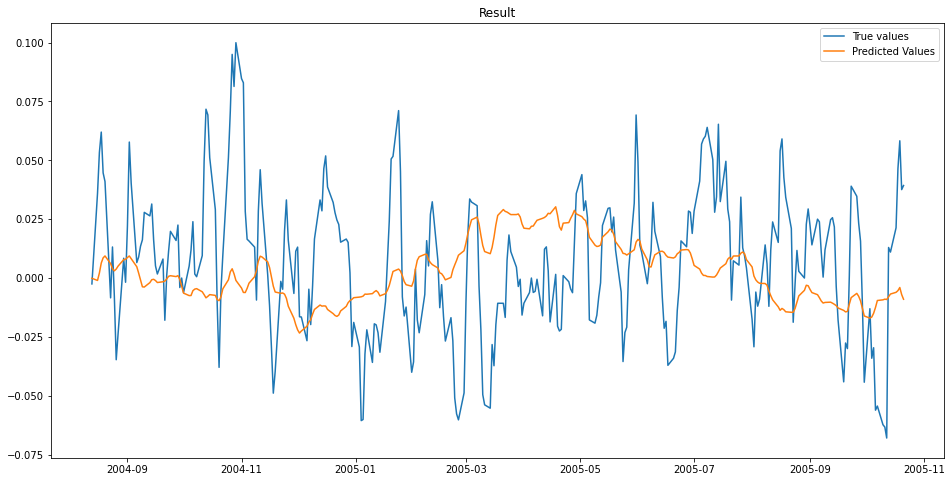


MSE: 0.0011114726372863175

Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 12.1724
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 28 started. Searching for the next optimal point.

learning rate: 0.0022506529857244336
num_input_nodes: 161
dropout: 0.08522162464234627
sequence_length : 155
batch_size: 198



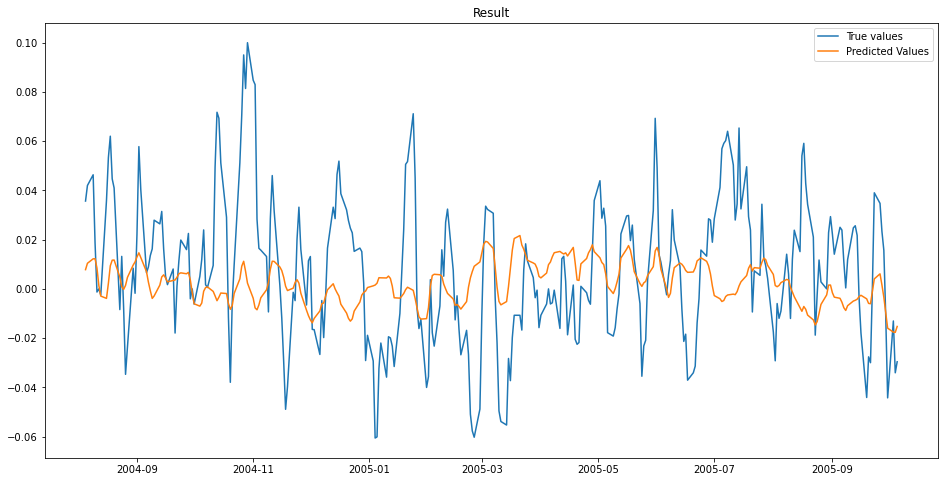


MSE: 0.0009132913216731708

Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 15.1918
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 29 started. Searching for the next optimal point.

learning rate: 0.00043407796537720076
num_input_nodes: 207
dropout: 0.05111844448881574
sequence_length : 187
batch_size: 195



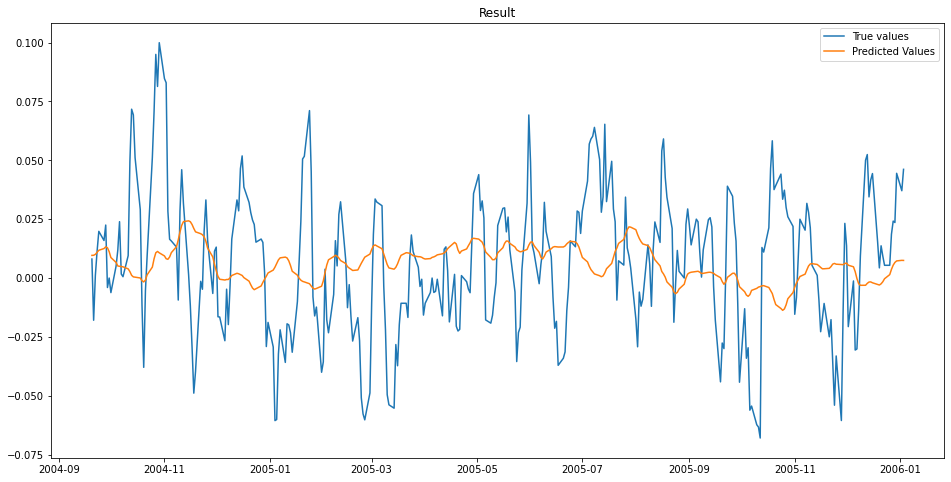


MSE: 0.0009900078651596171

Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 16.5576
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 30 started. Searching for the next optimal point.

learning rate: 0.008517400356986468
num_input_nodes: 211
dropout: 0.0
sequence_length : 146
batch_size: 242



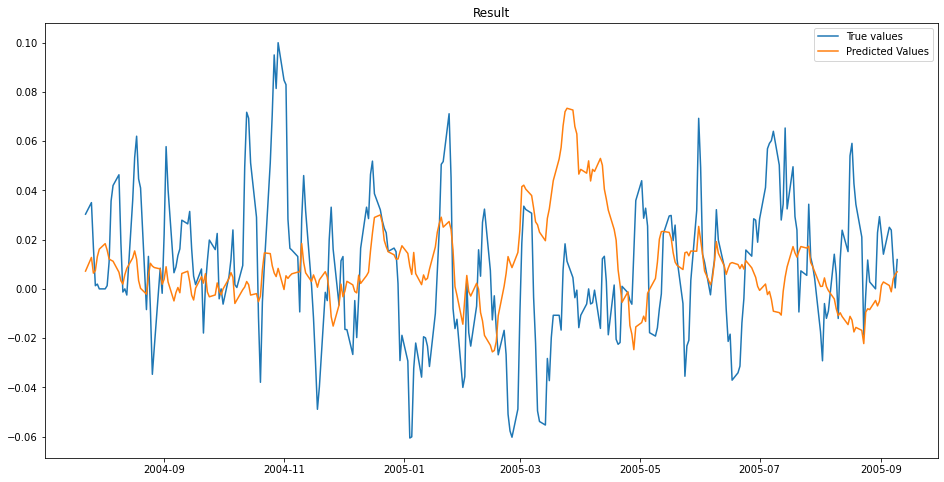


MSE: 0.001199707451170772

Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 23.4550
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 31 started. Searching for the next optimal point.

learning rate: 0.0005117164259136585
num_input_nodes: 166
dropout: 0.047229609555084144
sequence_length : 100
batch_size: 33



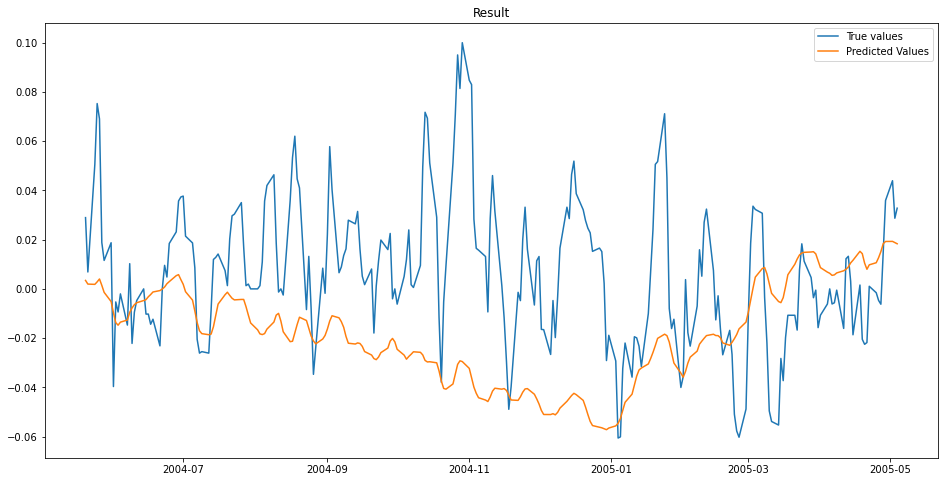


MSE: 0.0018471079357546163

Iteration No: 31 ended. Search finished for the next optimal point.
Time taken: 19.6082
Function value obtained: 0.0018
Current minimum: 0.0008
Iteration No: 32 started. Searching for the next optimal point.

learning rate: 0.0008633902007401385
num_input_nodes: 127
dropout: 0.008028454523932834
sequence_length : 176
batch_size: 126



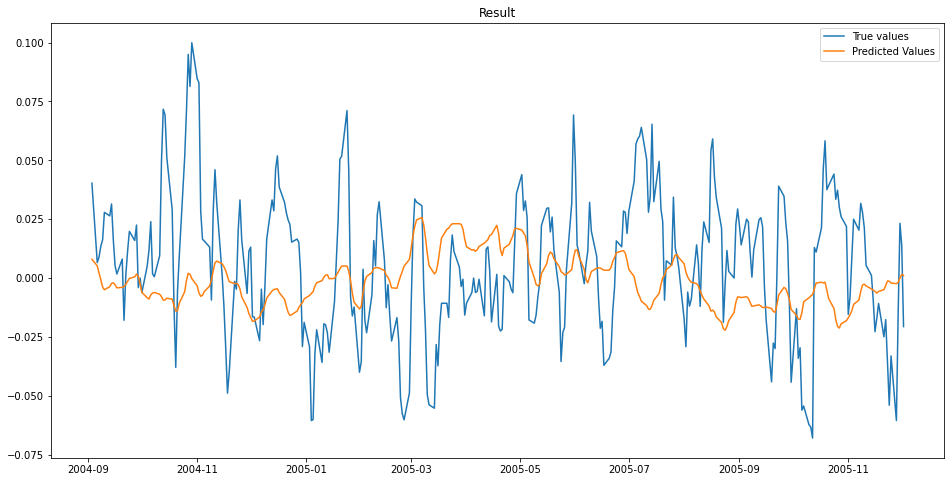


MSE: 0.0010818884951397678

Iteration No: 32 ended. Search finished for the next optimal point.
Time taken: 14.4504
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 33 started. Searching for the next optimal point.

learning rate: 0.00897823091951637
num_input_nodes: 133
dropout: 0.16453215209881997
sequence_length : 117
batch_size: 250



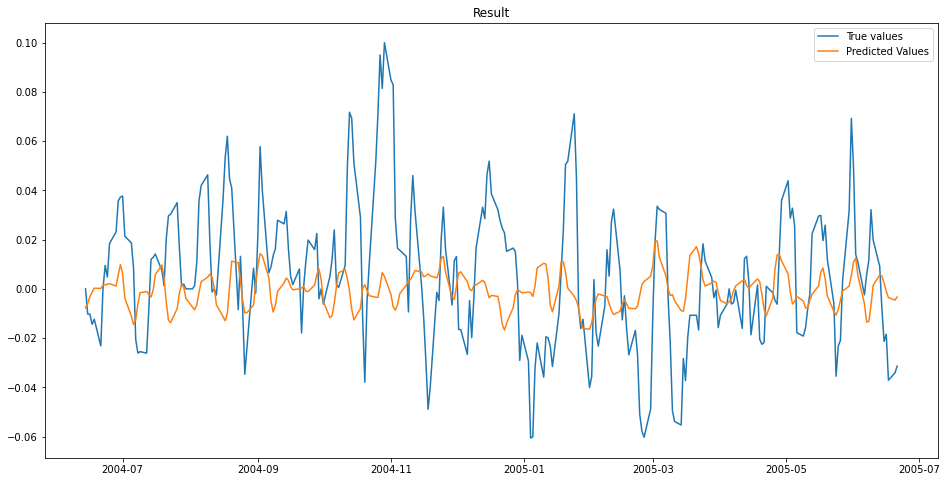


MSE: 0.0008727687374128998

Iteration No: 33 ended. Search finished for the next optimal point.
Time taken: 11.0333
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 34 started. Searching for the next optimal point.

learning rate: 0.00017560610750590048
num_input_nodes: 124
dropout: 0.17647804430219854
sequence_length : 181
batch_size: 219



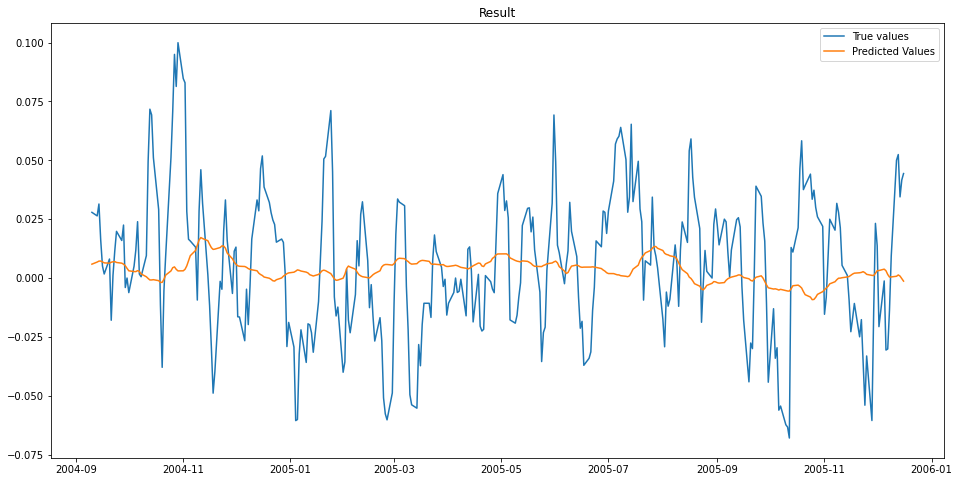


MSE: 0.0009683656693918077

Iteration No: 34 ended. Search finished for the next optimal point.
Time taken: 13.2153
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 35 started. Searching for the next optimal point.

learning rate: 0.00024348795487965852
num_input_nodes: 252
dropout: 0.2367435114333478
sequence_length : 148
batch_size: 75



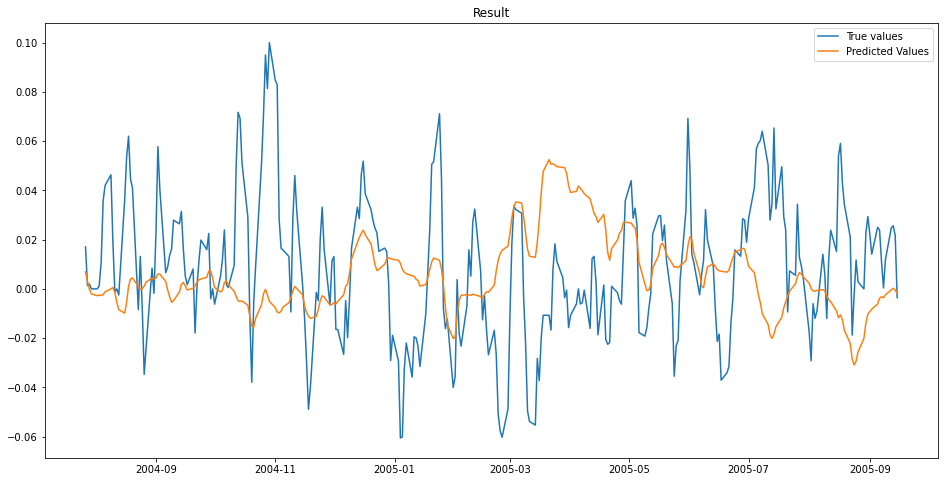


MSE: 0.0011809526245257493

Iteration No: 35 ended. Search finished for the next optimal point.
Time taken: 26.1607
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 36 started. Searching for the next optimal point.

learning rate: 0.0006407324911213308
num_input_nodes: 213
dropout: 0.07080754855435638
sequence_length : 128
batch_size: 85



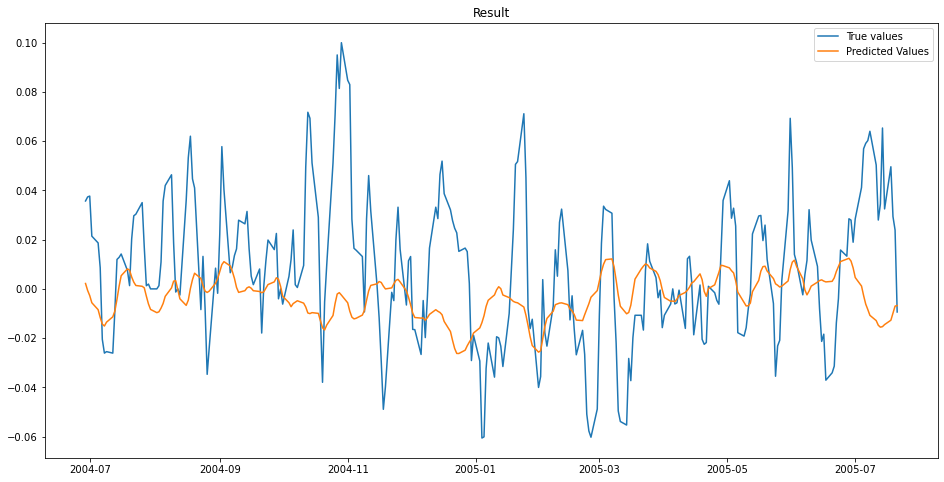


MSE: 0.001020599487633508

Iteration No: 36 ended. Search finished for the next optimal point.
Time taken: 17.0640
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 37 started. Searching for the next optimal point.

learning rate: 0.001463854811559264
num_input_nodes: 12
dropout: 0.23787833159292443
sequence_length : 123
batch_size: 149



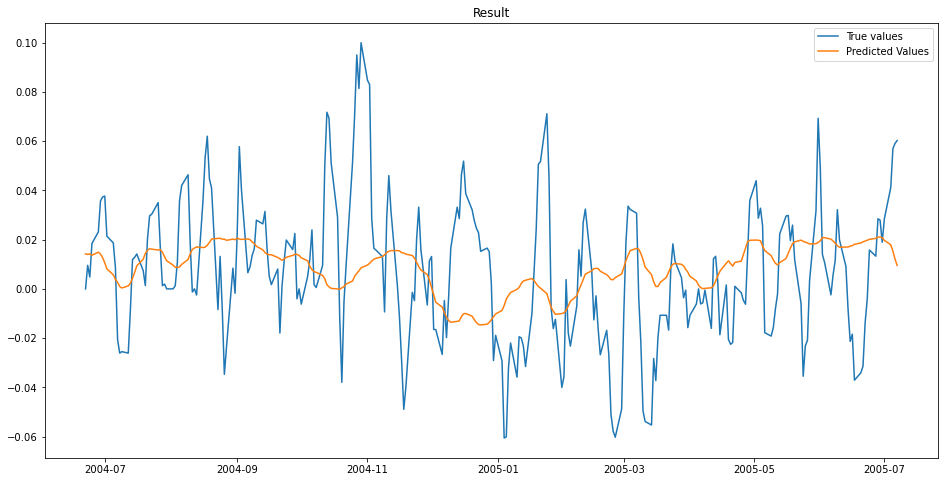


MSE: 0.0008521604048933409

Iteration No: 37 ended. Search finished for the next optimal point.
Time taken: 10.2117
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 38 started. Searching for the next optimal point.

learning rate: 0.00015857125662625777
num_input_nodes: 44
dropout: 0.25
sequence_length : 116
batch_size: 213



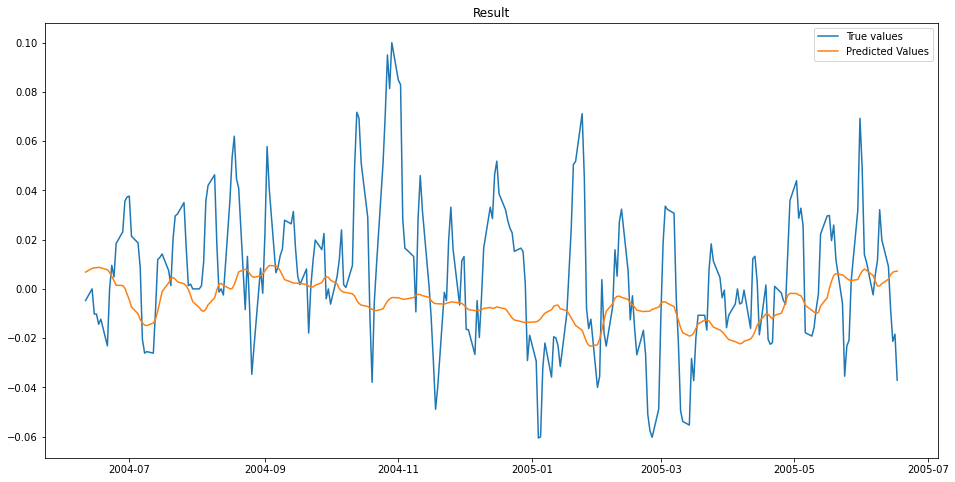


MSE: 0.0008946504492385244

Iteration No: 38 ended. Search finished for the next optimal point.
Time taken: 9.5826
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 39 started. Searching for the next optimal point.

learning rate: 0.008510984339216363
num_input_nodes: 6
dropout: 0.05192338510125548
sequence_length : 118
batch_size: 2



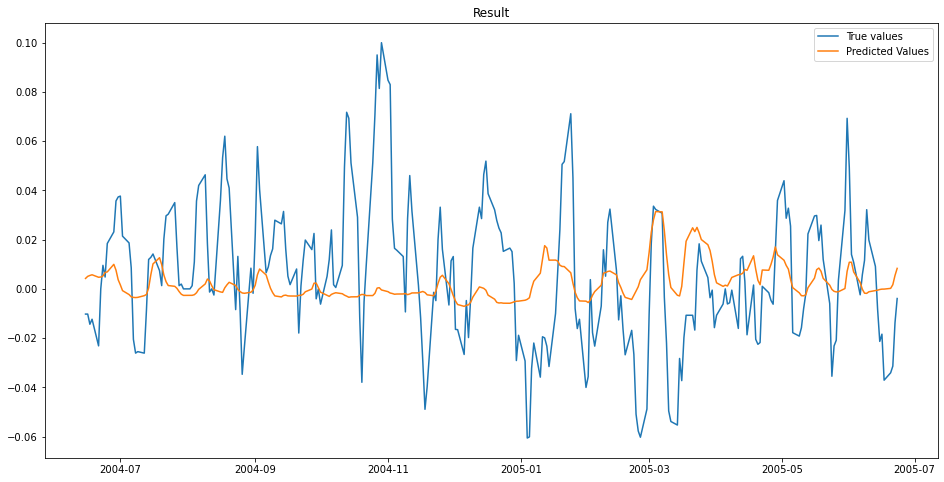


MSE: 0.0008558147630157351

Iteration No: 39 ended. Search finished for the next optimal point.
Time taken: 106.1622
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 40 started. Searching for the next optimal point.

learning rate: 0.00025023919664219615
num_input_nodes: 244
dropout: 0.1194401150232195
sequence_length : 114
batch_size: 166



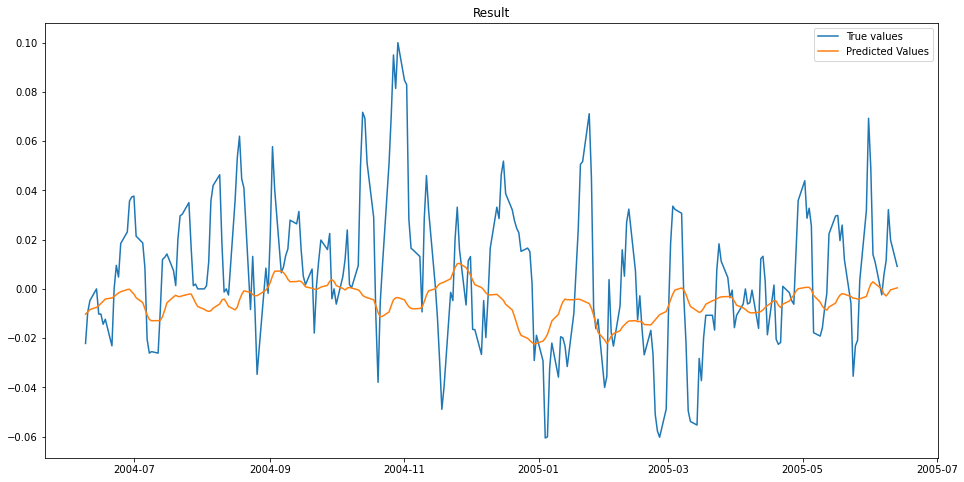


MSE: 0.000879314334854443

Iteration No: 40 ended. Search finished for the next optimal point.
Time taken: 13.7050
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 41 started. Searching for the next optimal point.

learning rate: 0.0006916911497906814
num_input_nodes: 142
dropout: 0.18595234380023104
sequence_length : 166
batch_size: 109



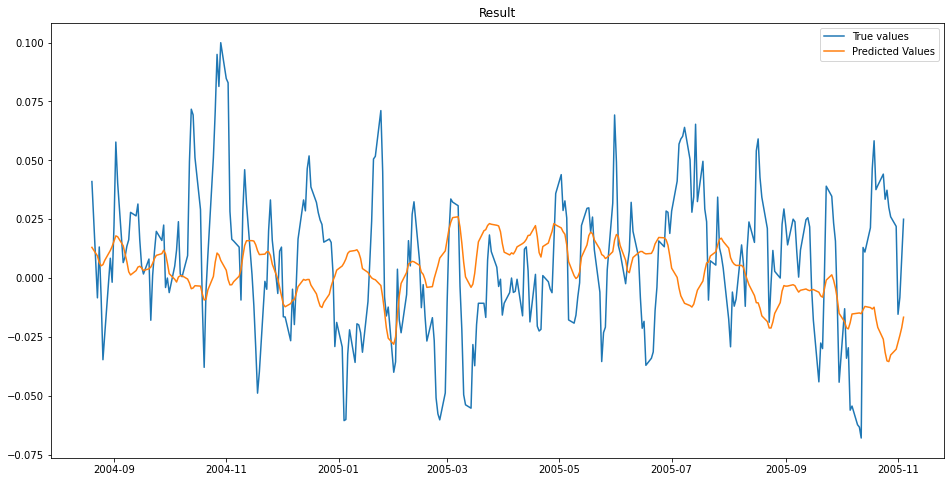


MSE: 0.0010836485989242342

Iteration No: 41 ended. Search finished for the next optimal point.
Time taken: 17.8592
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 42 started. Searching for the next optimal point.

learning rate: 0.006257393327206118
num_input_nodes: 86
dropout: 0.12898899378067608
sequence_length : 178
batch_size: 185



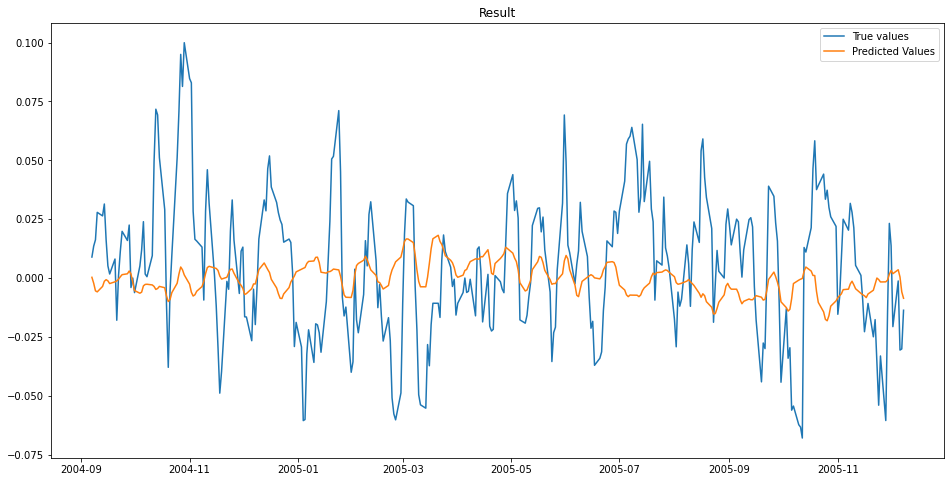


MSE: 0.000998545242076269

Iteration No: 42 ended. Search finished for the next optimal point.
Time taken: 11.6218
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 43 started. Searching for the next optimal point.

learning rate: 0.0030855428636112625
num_input_nodes: 256
dropout: 0.1902904780216836
sequence_length : 117
batch_size: 122



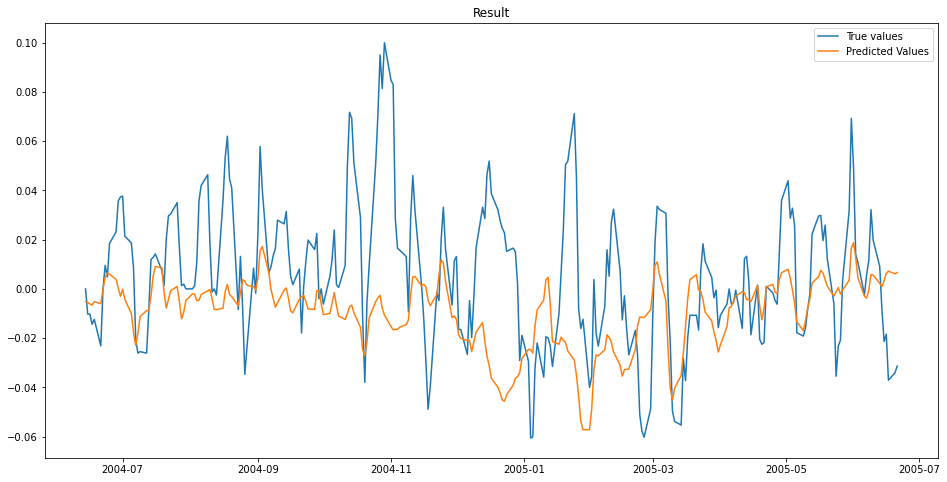


MSE: 0.0010801181703740726

Iteration No: 43 ended. Search finished for the next optimal point.
Time taken: 15.6664
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 44 started. Searching for the next optimal point.

learning rate: 0.00015999394011370437
num_input_nodes: 181
dropout: 0.08604513919744848
sequence_length : 110
batch_size: 34



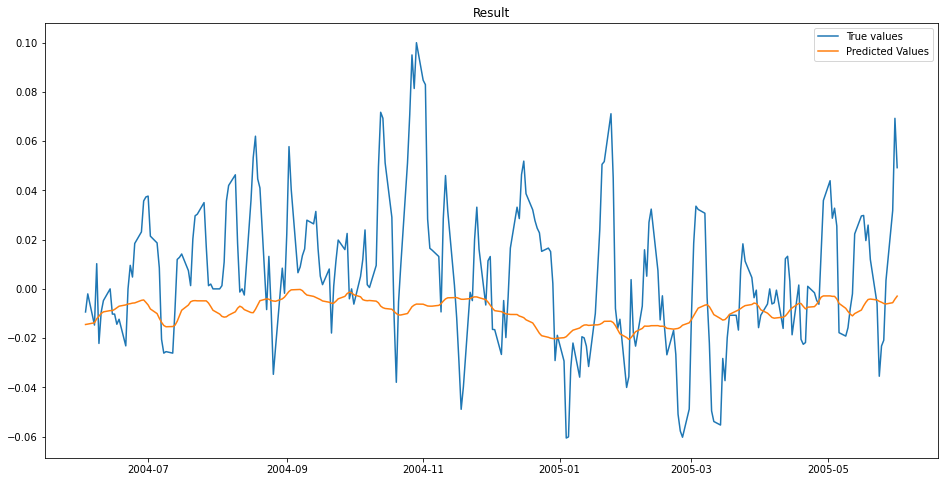


MSE: 0.0009871141895896375

Iteration No: 44 ended. Search finished for the next optimal point.
Time taken: 21.7853
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 45 started. Searching for the next optimal point.

learning rate: 0.002576050711952346
num_input_nodes: 217
dropout: 0.18008333534734158
sequence_length : 187
batch_size: 33



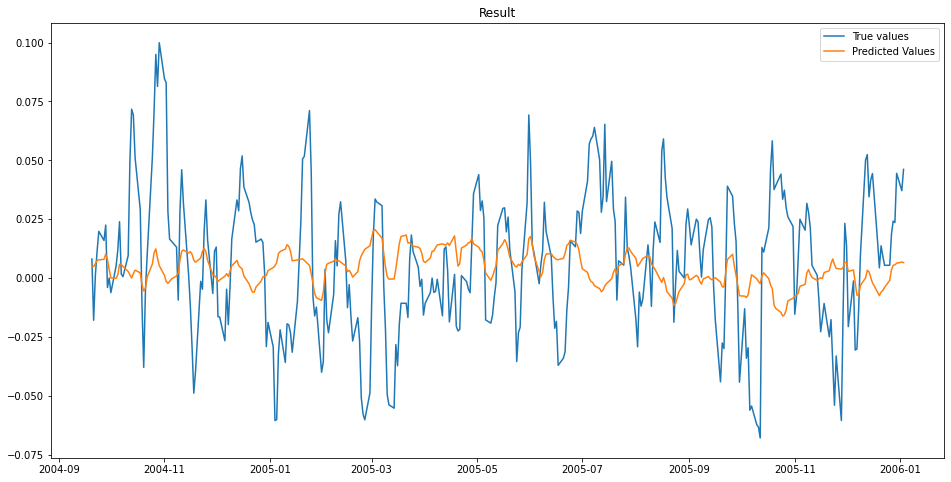


MSE: 0.000981170093400307

Iteration No: 45 ended. Search finished for the next optimal point.
Time taken: 38.0947
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 46 started. Searching for the next optimal point.

learning rate: 0.0036879818841733195
num_input_nodes: 88
dropout: 0.24555595662566815
sequence_length : 165
batch_size: 41



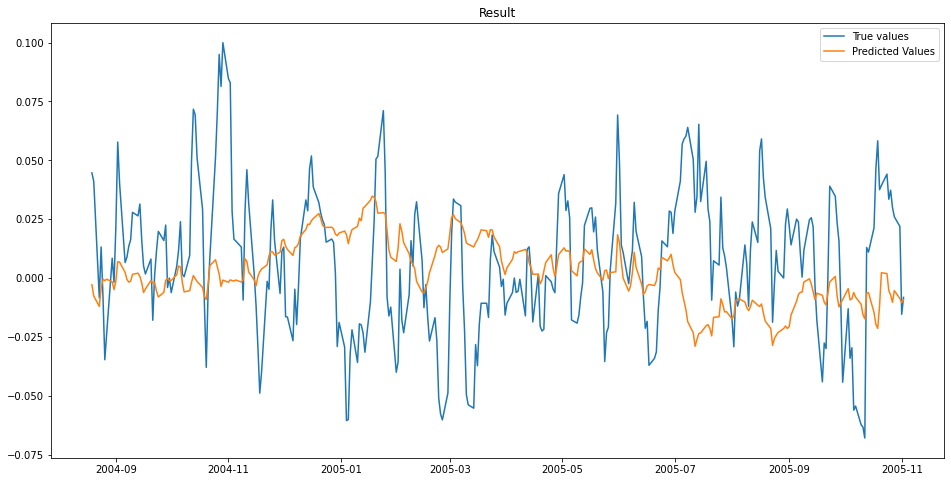


MSE: 0.0011688436896261894

Iteration No: 46 ended. Search finished for the next optimal point.
Time taken: 26.7297
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 47 started. Searching for the next optimal point.

learning rate: 0.00011635407776633327
num_input_nodes: 92
dropout: 0.19701404602314318
sequence_length : 157
batch_size: 26



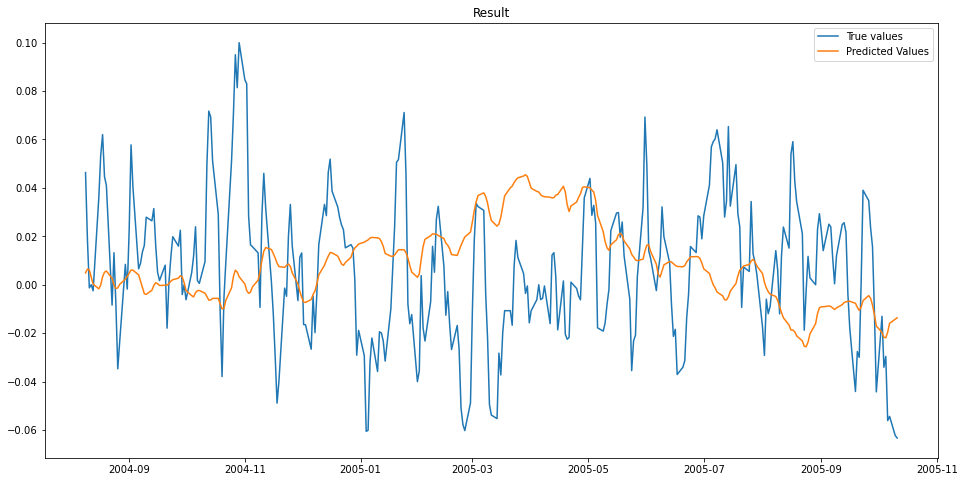


MSE: 0.0012733751621637607

Iteration No: 47 ended. Search finished for the next optimal point.
Time taken: 30.2016
Function value obtained: 0.0013
Current minimum: 0.0008
Iteration No: 48 started. Searching for the next optimal point.

learning rate: 0.00098393071892428
num_input_nodes: 216
dropout: 0.0919402180489166
sequence_length : 168
batch_size: 52



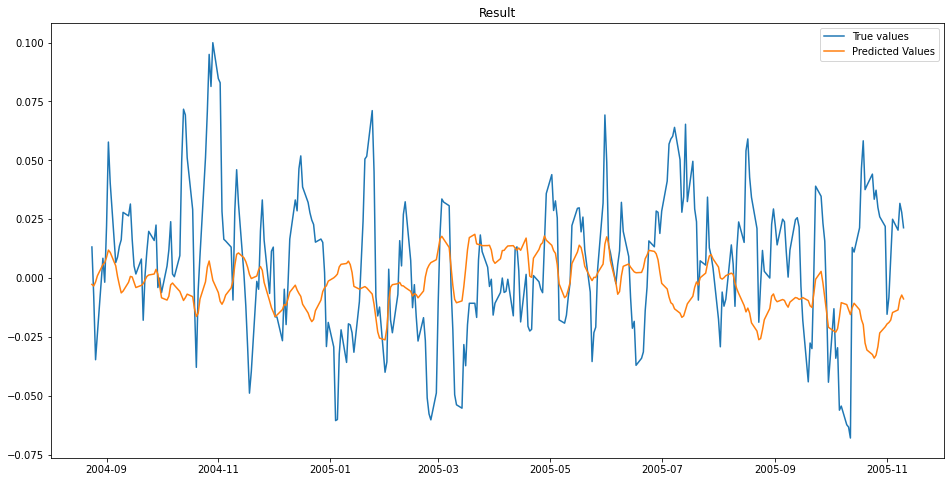


MSE: 0.001136145801304285

Iteration No: 48 ended. Search finished for the next optimal point.
Time taken: 23.9230
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 49 started. Searching for the next optimal point.

learning rate: 0.004733515264416734
num_input_nodes: 5
dropout: 0.25
sequence_length : 123
batch_size: 250



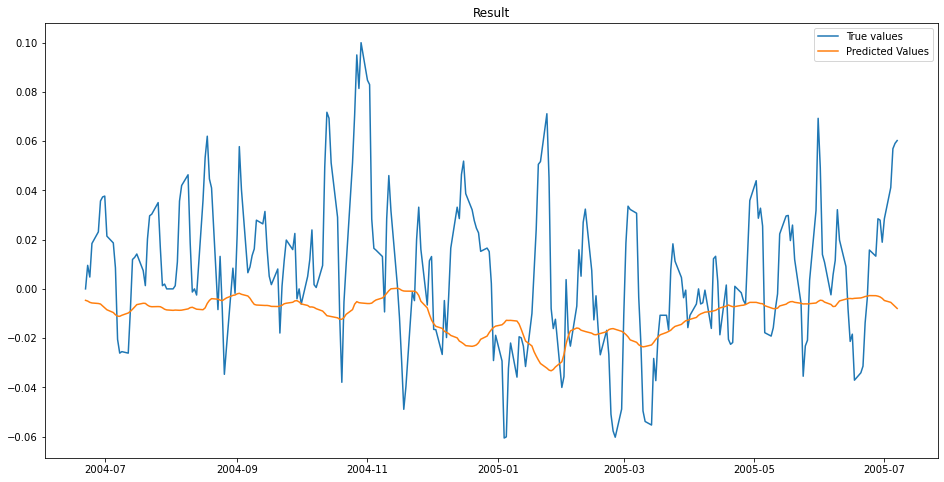


MSE: 0.0011409027299969677

Iteration No: 49 ended. Search finished for the next optimal point.
Time taken: 8.6155
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 50 started. Searching for the next optimal point.

learning rate: 0.0015196648522700794
num_input_nodes: 144
dropout: 0.12923914683506915
sequence_length : 107
batch_size: 181



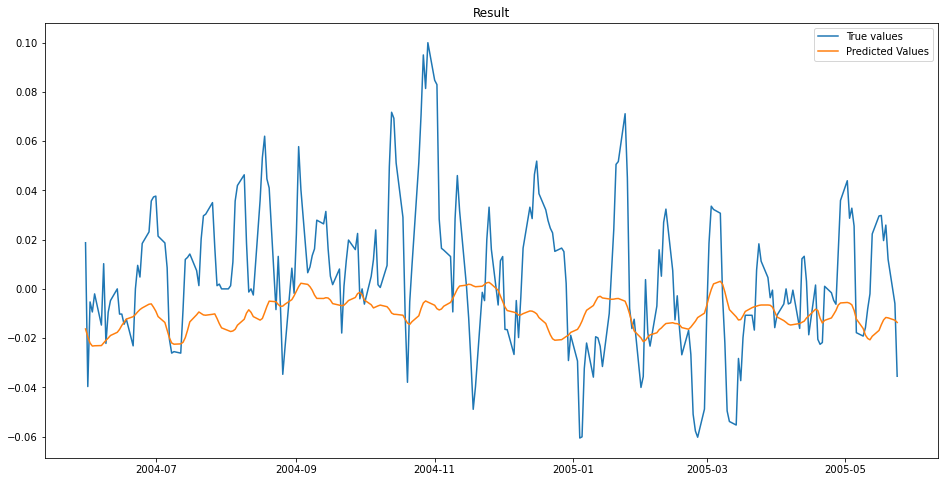


MSE: 0.001012680653894749

Iteration No: 50 ended. Search finished for the next optimal point.
Time taken: 10.5491
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 51 started. Searching for the next optimal point.

learning rate: 0.00035696221331054826
num_input_nodes: 60
dropout: 0.15871059674378532
sequence_length : 152
batch_size: 205



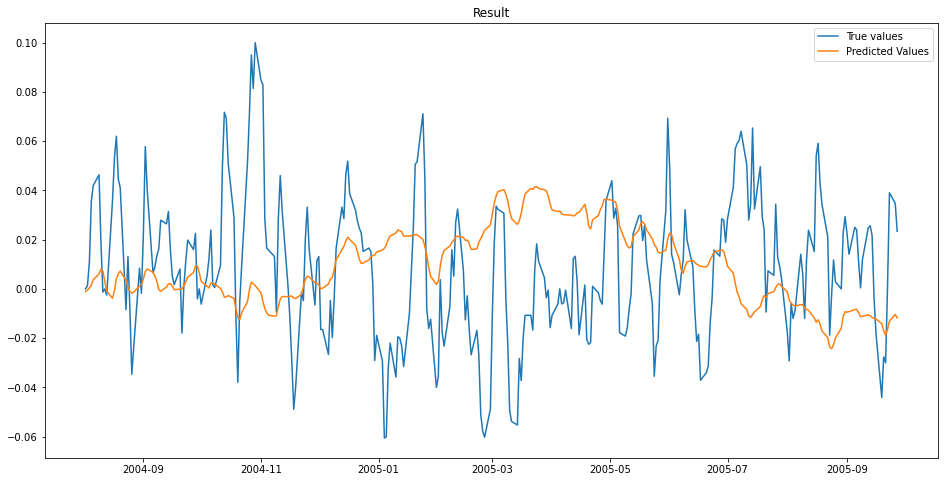


MSE: 0.0012618177117135097

Iteration No: 51 ended. Search finished for the next optimal point.
Time taken: 13.4462
Function value obtained: 0.0013
Current minimum: 0.0008
Iteration No: 52 started. Searching for the next optimal point.

learning rate: 0.0001188409223381412
num_input_nodes: 177
dropout: 0.21891156143998414
sequence_length : 168
batch_size: 175



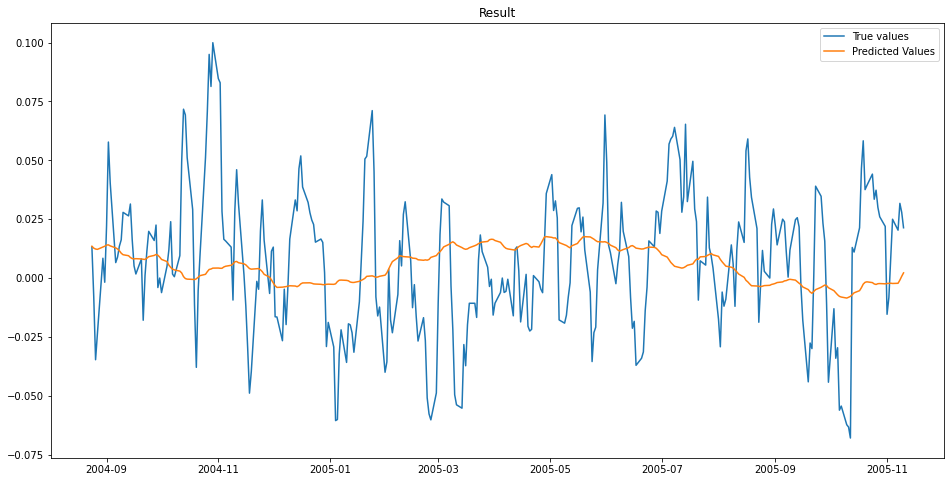


MSE: 0.0009617300563040468

Iteration No: 52 ended. Search finished for the next optimal point.
Time taken: 15.6499
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 53 started. Searching for the next optimal point.

learning rate: 0.0033298625298422277
num_input_nodes: 48
dropout: 0.19978580796758103
sequence_length : 124
batch_size: 174



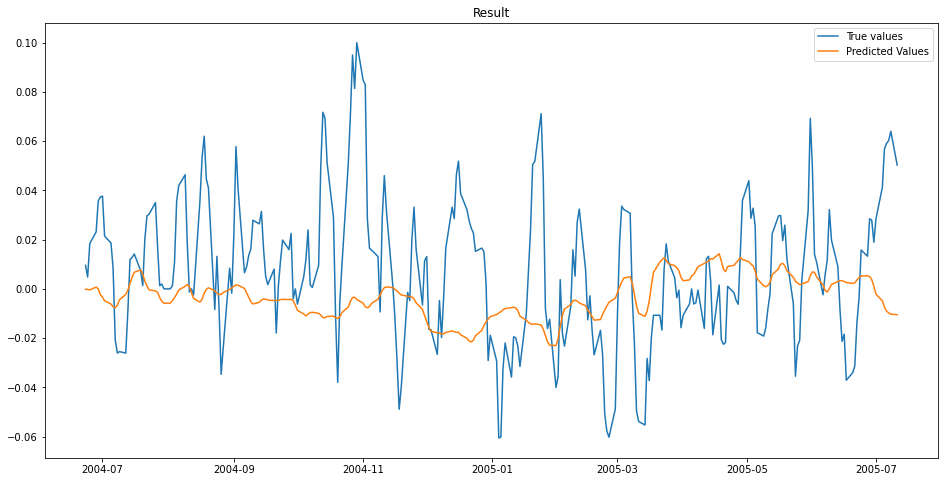


MSE: 0.0010381905014276366

Iteration No: 53 ended. Search finished for the next optimal point.
Time taken: 10.6526
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 54 started. Searching for the next optimal point.

learning rate: 0.00036027060747977226
num_input_nodes: 102
dropout: 0.04395199891507324
sequence_length : 157
batch_size: 103



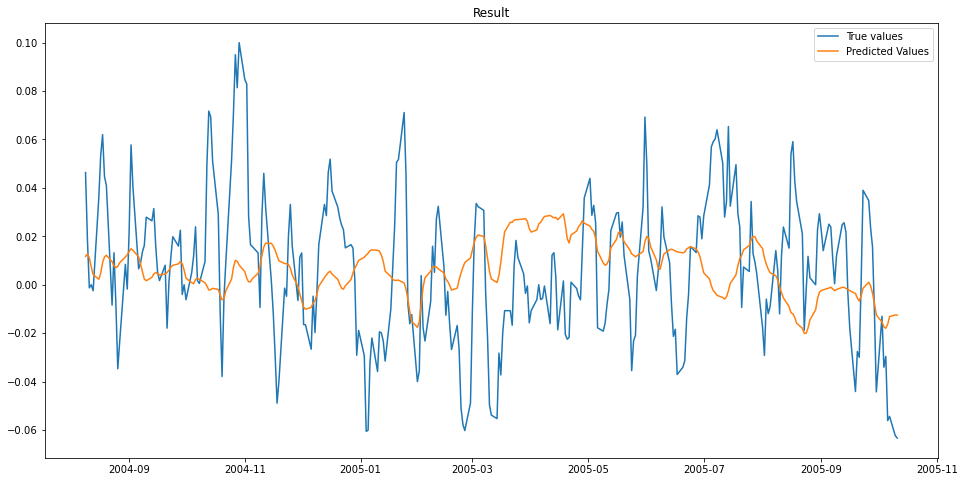


MSE: 0.0010120253733057372

Iteration No: 54 ended. Search finished for the next optimal point.
Time taken: 17.5699
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 55 started. Searching for the next optimal point.

learning rate: 0.0007041754428186566
num_input_nodes: 24
dropout: 0.1808445203832612
sequence_length : 193
batch_size: 13



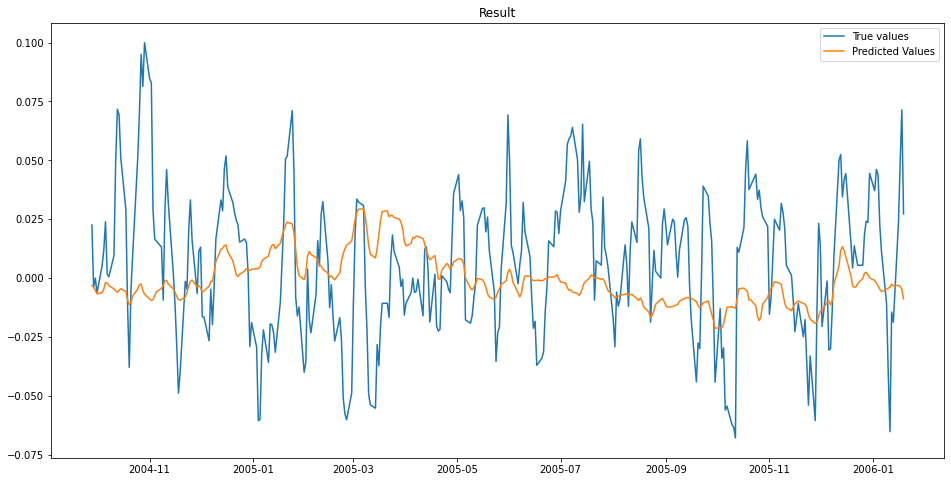


MSE: 0.0010978244732296665

Iteration No: 55 ended. Search finished for the next optimal point.
Time taken: 47.6941
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 56 started. Searching for the next optimal point.

learning rate: 0.009919908572416309
num_input_nodes: 75
dropout: 0.06993407026048219
sequence_length : 116
batch_size: 224



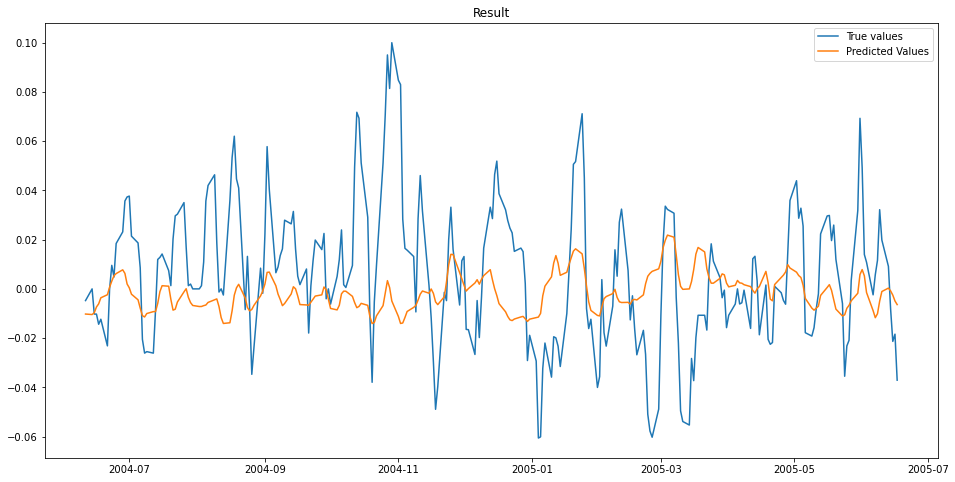


MSE: 0.000893063893937862

Iteration No: 56 ended. Search finished for the next optimal point.
Time taken: 9.7123
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 57 started. Searching for the next optimal point.

learning rate: 0.0006537249019477047
num_input_nodes: 49
dropout: 0.25
sequence_length : 111
batch_size: 37



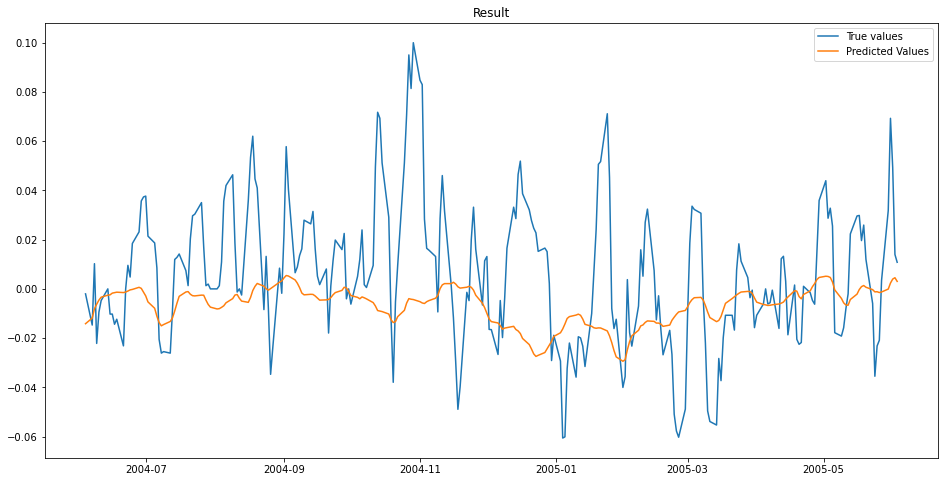


MSE: 0.0009588312808175356

Iteration No: 57 ended. Search finished for the next optimal point.
Time taken: 15.0037
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 58 started. Searching for the next optimal point.

learning rate: 0.0009519885287777707
num_input_nodes: 132
dropout: 0.029560473583090864
sequence_length : 146
batch_size: 176



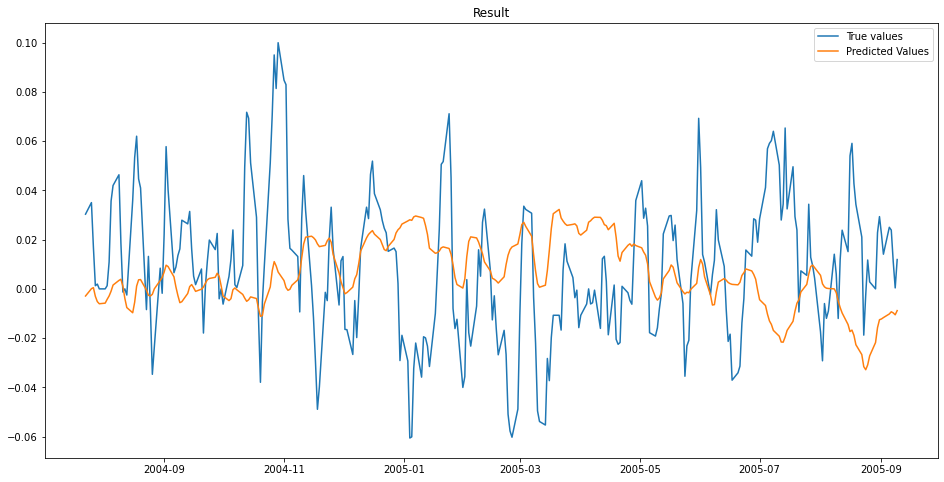


MSE: 0.001185843089716284

Iteration No: 58 ended. Search finished for the next optimal point.
Time taken: 14.6628
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 59 started. Searching for the next optimal point.

learning rate: 0.002538908829901992
num_input_nodes: 248
dropout: 0.17595507163026644
sequence_length : 114
batch_size: 241



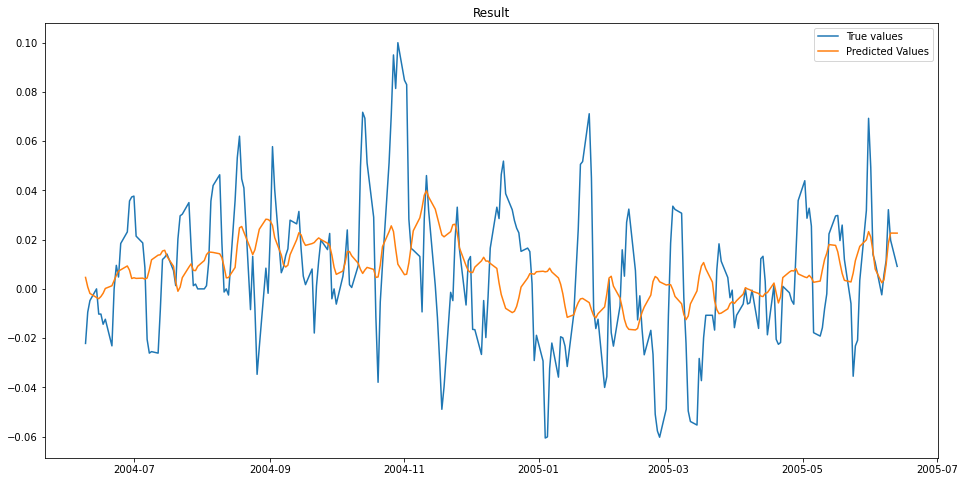


MSE: 0.0007996556702310197

Iteration No: 59 ended. Search finished for the next optimal point.
Time taken: 12.6981
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 60 started. Searching for the next optimal point.

learning rate: 0.00010180274711078338
num_input_nodes: 163
dropout: 0.07920302891584906
sequence_length : 176
batch_size: 158



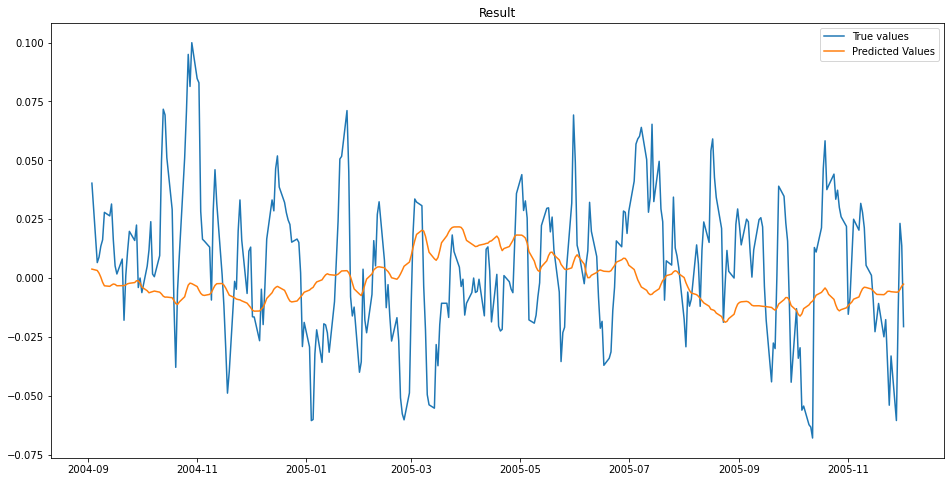


MSE: 0.001074296511042396

Iteration No: 60 ended. Search finished for the next optimal point.
Time taken: 19.0088
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 61 started. Searching for the next optimal point.

learning rate: 0.004601649422606682
num_input_nodes: 85
dropout: 0.015120516756848643
sequence_length : 148
batch_size: 188



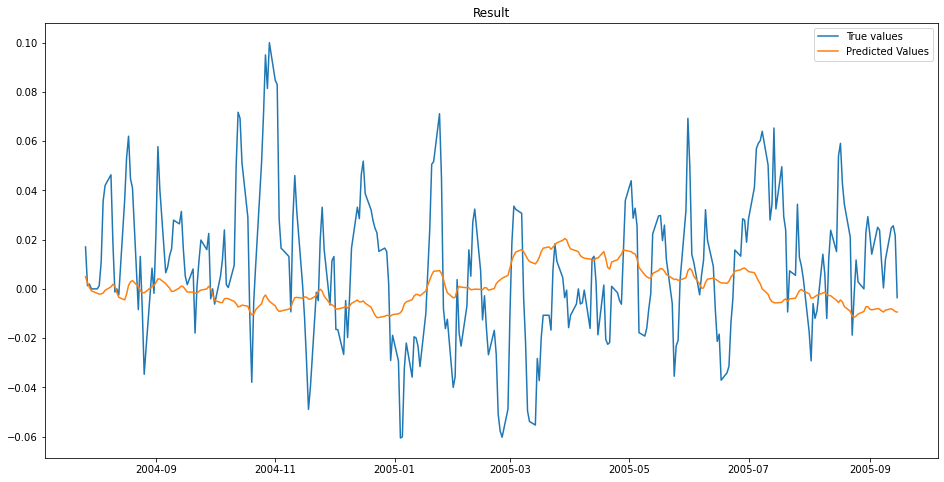


MSE: 0.0009965253319110556

Iteration No: 61 ended. Search finished for the next optimal point.
Time taken: 10.7907
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 62 started. Searching for the next optimal point.

learning rate: 0.003778761170677325
num_input_nodes: 207
dropout: 0.17932400172786384
sequence_length : 169
batch_size: 166



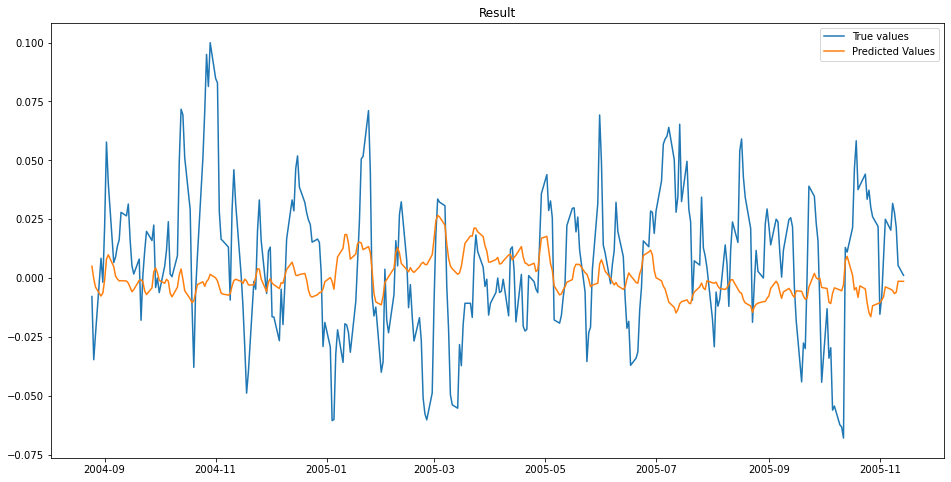


MSE: 0.0010176099513886587

Iteration No: 62 ended. Search finished for the next optimal point.
Time taken: 21.5912
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 63 started. Searching for the next optimal point.

learning rate: 0.00019402553403223018
num_input_nodes: 215
dropout: 0.2030850743884873
sequence_length : 113
batch_size: 151



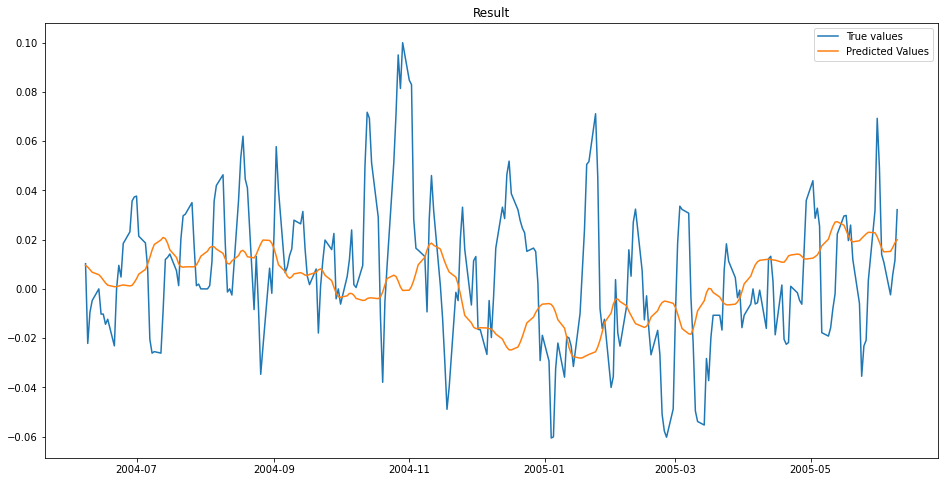


MSE: 0.0009739015886124614

Iteration No: 63 ended. Search finished for the next optimal point.
Time taken: 13.4515
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 64 started. Searching for the next optimal point.

learning rate: 0.00017700335372574941
num_input_nodes: 21
dropout: 0.0
sequence_length : 136
batch_size: 118



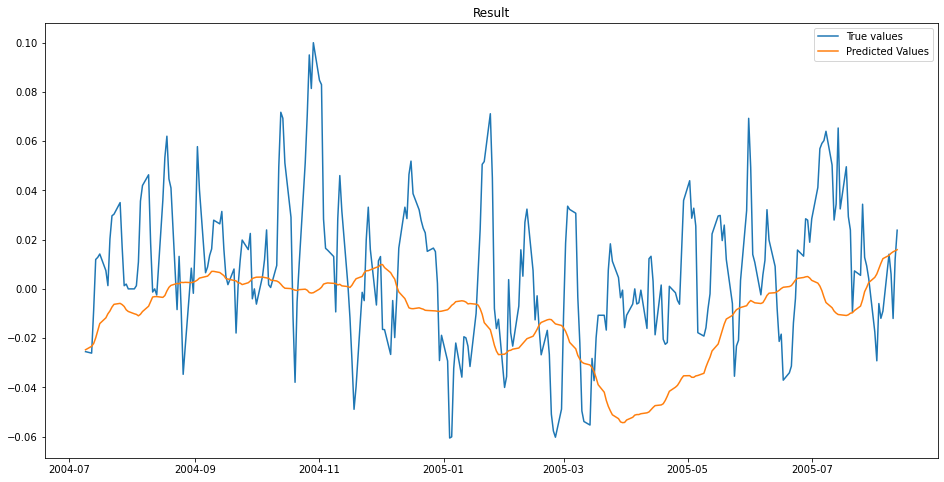


MSE: 0.0012724644585215654

Iteration No: 64 ended. Search finished for the next optimal point.
Time taken: 10.0766
Function value obtained: 0.0013
Current minimum: 0.0008
Iteration No: 65 started. Searching for the next optimal point.

learning rate: 0.0005066557516200589
num_input_nodes: 5
dropout: 0.16169150035243246
sequence_length : 115
batch_size: 28



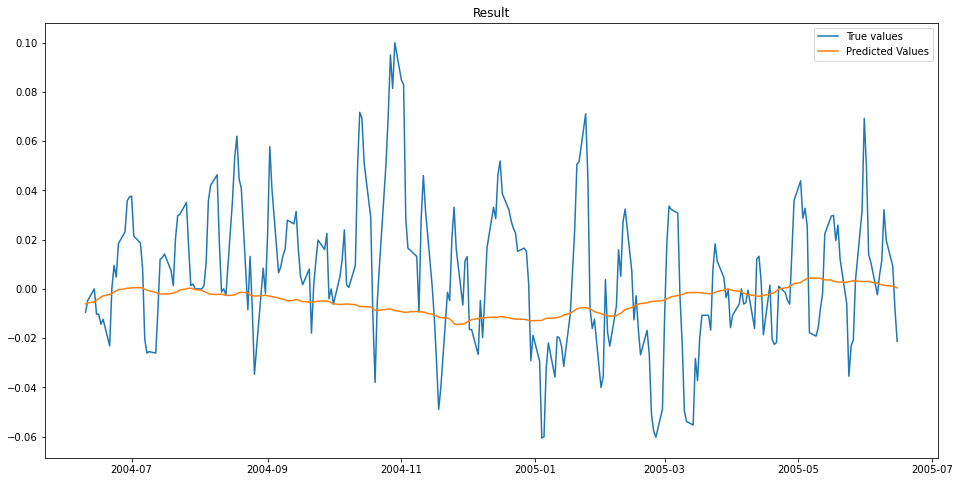


MSE: 0.0009487011294415104

Iteration No: 65 ended. Search finished for the next optimal point.
Time taken: 17.6610
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 66 started. Searching for the next optimal point.

learning rate: 0.0007673759927223413
num_input_nodes: 256
dropout: 0.14451784643246715
sequence_length : 115
batch_size: 231



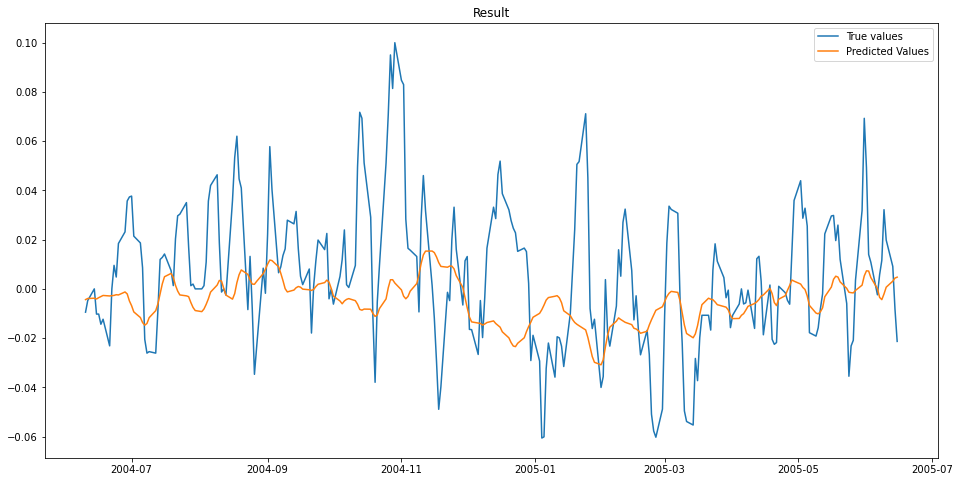


MSE: 0.0008922806190066917

Iteration No: 66 ended. Search finished for the next optimal point.
Time taken: 13.9713
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 67 started. Searching for the next optimal point.

learning rate: 0.00014476706831299192
num_input_nodes: 203
dropout: 0.14726485363284803
sequence_length : 200
batch_size: 166



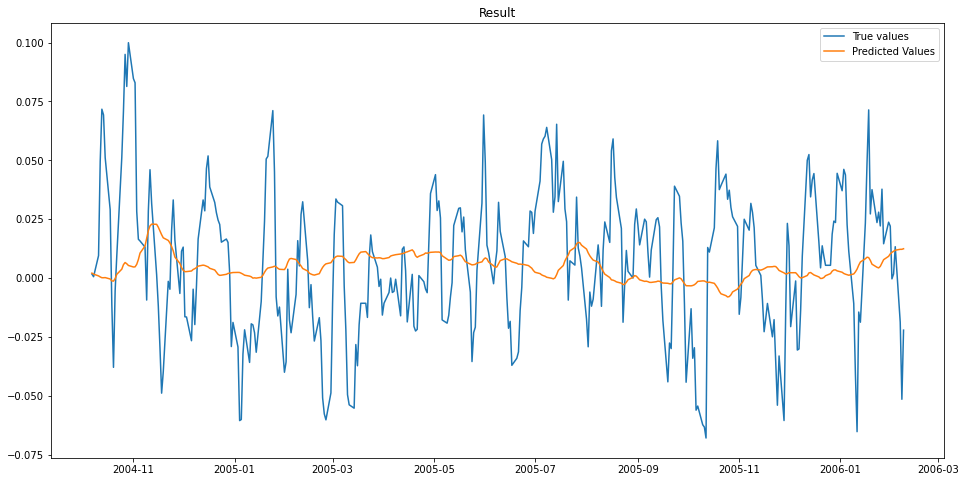


MSE: 0.0010057193081680002

Iteration No: 67 ended. Search finished for the next optimal point.
Time taken: 18.7596
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 68 started. Searching for the next optimal point.

learning rate: 0.0001703614412866861
num_input_nodes: 254
dropout: 0.19476335722100108
sequence_length : 100
batch_size: 245



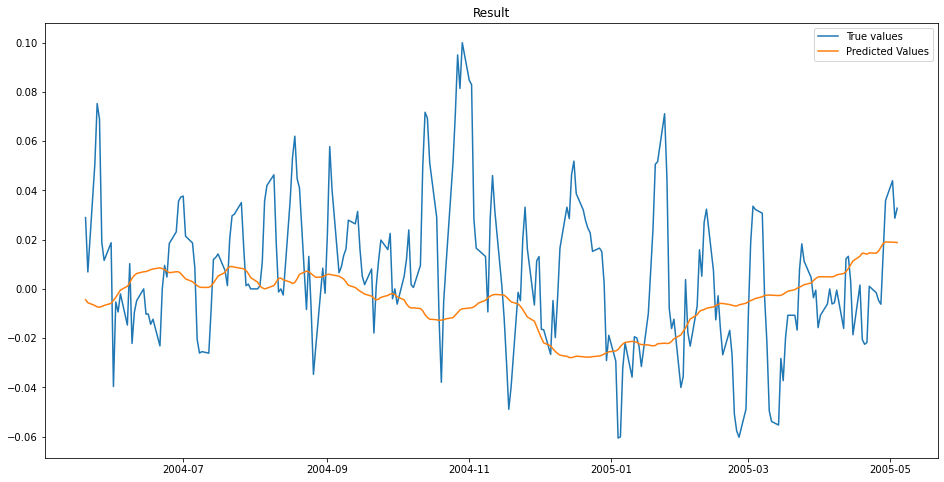


MSE: 0.0011026538147023623

Iteration No: 68 ended. Search finished for the next optimal point.
Time taken: 12.6666
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 69 started. Searching for the next optimal point.

learning rate: 0.00022898042712449123
num_input_nodes: 142
dropout: 0.017850679904295817
sequence_length : 167
batch_size: 36



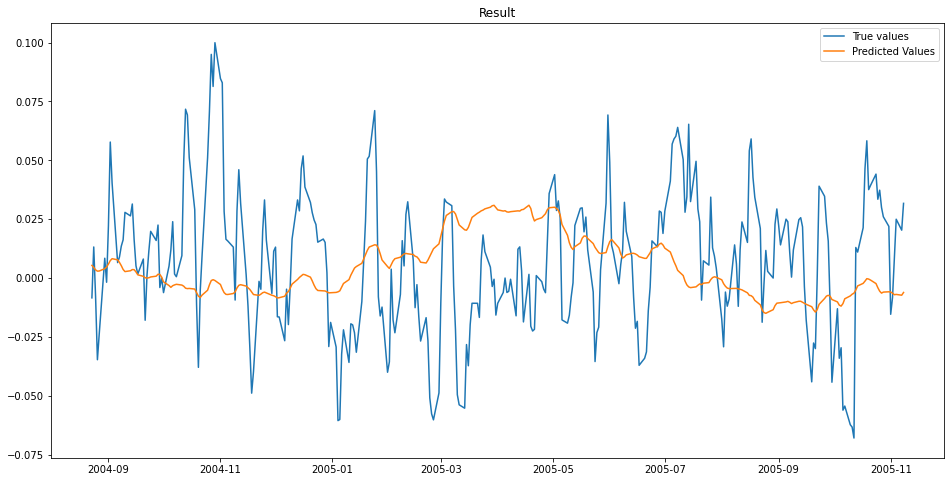


MSE: 0.0011125481164313306

Iteration No: 69 ended. Search finished for the next optimal point.
Time taken: 23.7984
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 70 started. Searching for the next optimal point.

learning rate: 0.00415313472997089
num_input_nodes: 163
dropout: 0.011486325079716865
sequence_length : 174
batch_size: 106



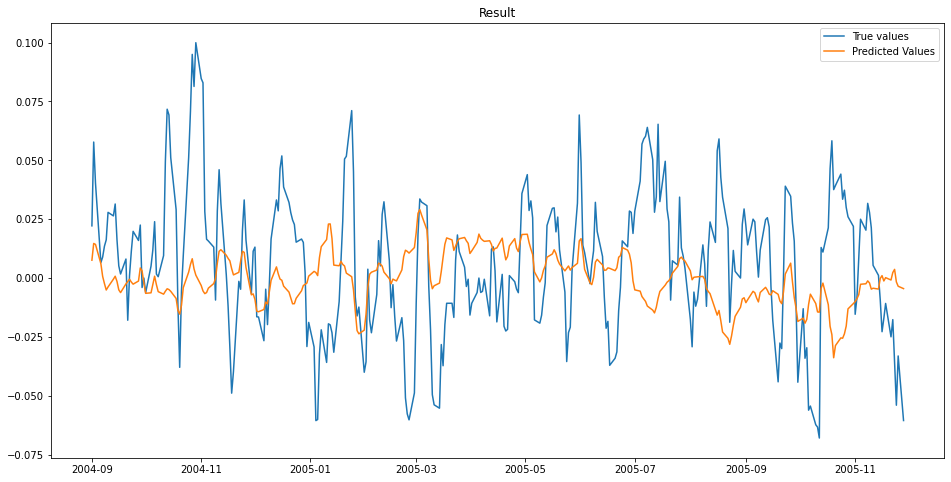


MSE: 0.0011067018547359845

Iteration No: 70 ended. Search finished for the next optimal point.
Time taken: 20.4597
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 71 started. Searching for the next optimal point.

learning rate: 0.0002720785430334909
num_input_nodes: 125
dropout: 0.10442366886174766
sequence_length : 140
batch_size: 97



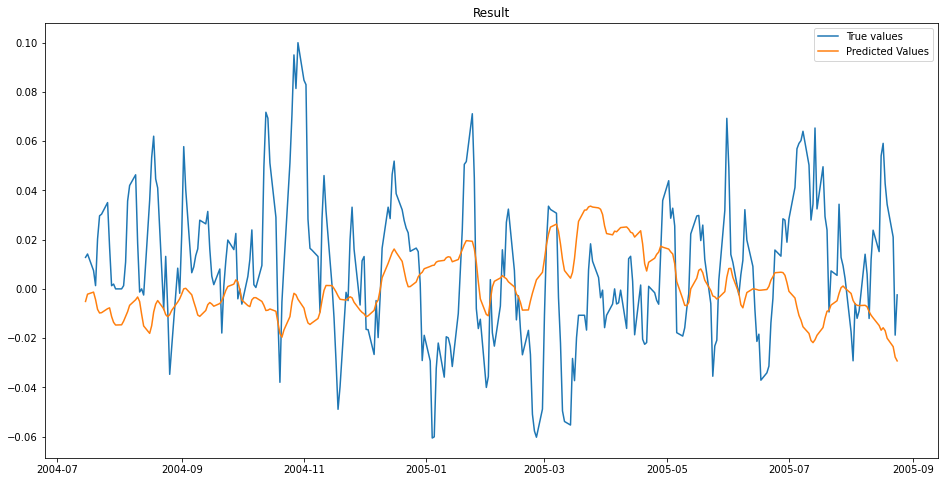


MSE: 0.0011797747923614603

Iteration No: 71 ended. Search finished for the next optimal point.
Time taken: 20.9547
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 72 started. Searching for the next optimal point.

learning rate: 0.001934714882000995
num_input_nodes: 14
dropout: 0.1496472888041074
sequence_length : 176
batch_size: 40



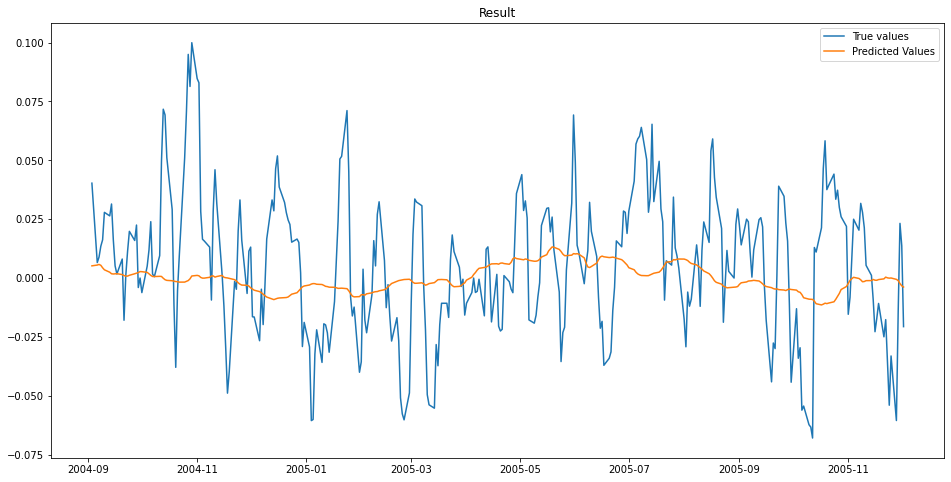


MSE: 0.0009616273506988513

Iteration No: 72 ended. Search finished for the next optimal point.
Time taken: 14.7278
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 73 started. Searching for the next optimal point.

learning rate: 0.0001960116571995673
num_input_nodes: 238
dropout: 0.016410823138326067
sequence_length : 128
batch_size: 216



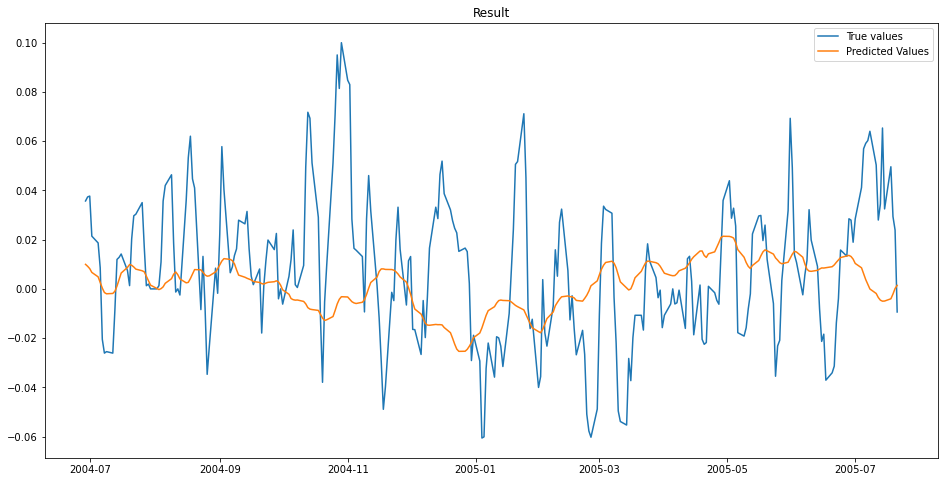


MSE: 0.0010003062663559118

Iteration No: 73 ended. Search finished for the next optimal point.
Time taken: 15.7973
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 74 started. Searching for the next optimal point.

learning rate: 0.0016564469777783752
num_input_nodes: 168
dropout: 0.10476539484311784
sequence_length : 179
batch_size: 71



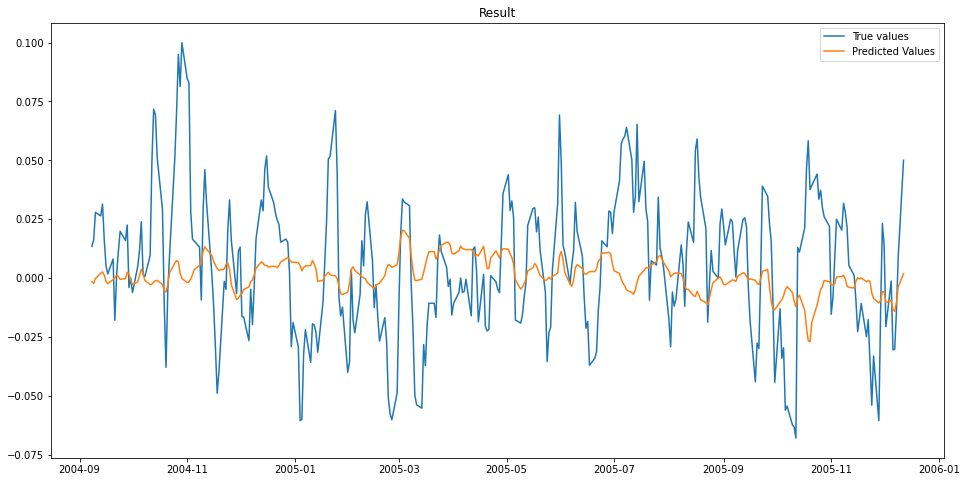


MSE: 0.0009563600776925547

Iteration No: 74 ended. Search finished for the next optimal point.
Time taken: 25.0544
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 75 started. Searching for the next optimal point.

learning rate: 0.00020458807202446572
num_input_nodes: 88
dropout: 0.2289375289856191
sequence_length : 199
batch_size: 222



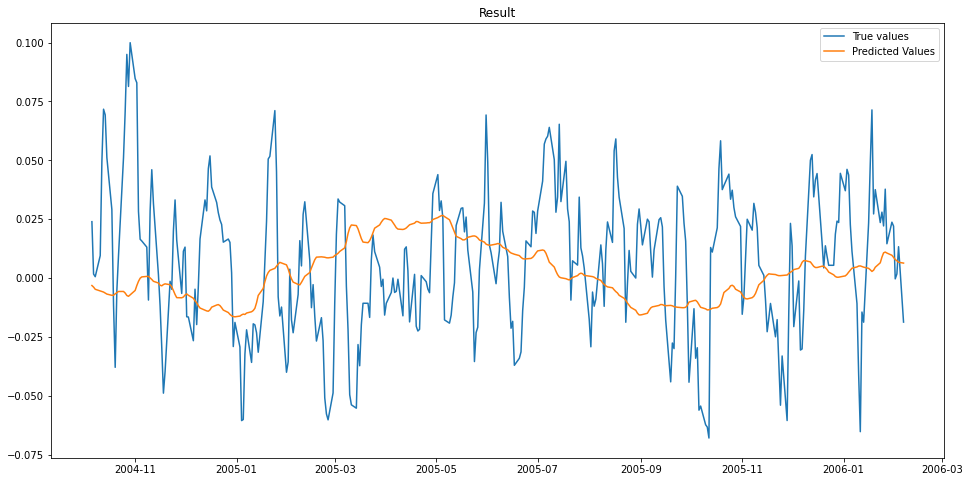


MSE: 0.0011510873215004476

Iteration No: 75 ended. Search finished for the next optimal point.
Time taken: 13.5086
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 76 started. Searching for the next optimal point.

learning rate: 0.00936354814193516
num_input_nodes: 58
dropout: 0.018650182734457125
sequence_length : 177
batch_size: 155



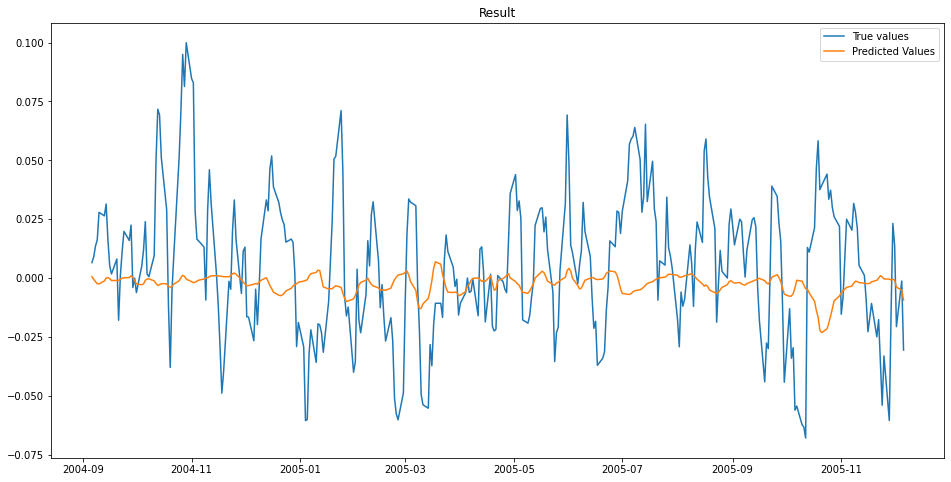


MSE: 0.0010099244880396388

Iteration No: 76 ended. Search finished for the next optimal point.
Time taken: 12.1036
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 77 started. Searching for the next optimal point.

learning rate: 0.0006277318630327672
num_input_nodes: 170
dropout: 0.17310481009819254
sequence_length : 195
batch_size: 179



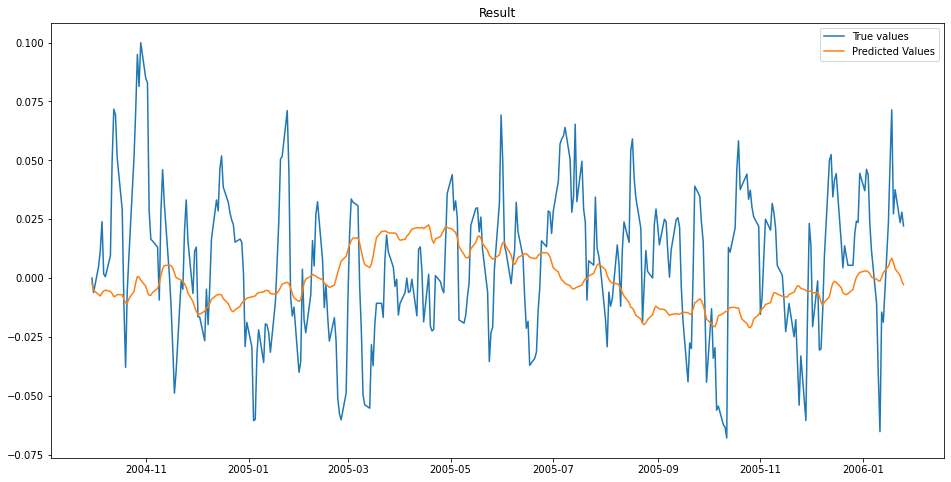


MSE: 0.001139650471253782

Iteration No: 77 ended. Search finished for the next optimal point.
Time taken: 18.5652
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 78 started. Searching for the next optimal point.

learning rate: 0.0006216653829877448
num_input_nodes: 117
dropout: 0.02517160087720311
sequence_length : 132
batch_size: 235



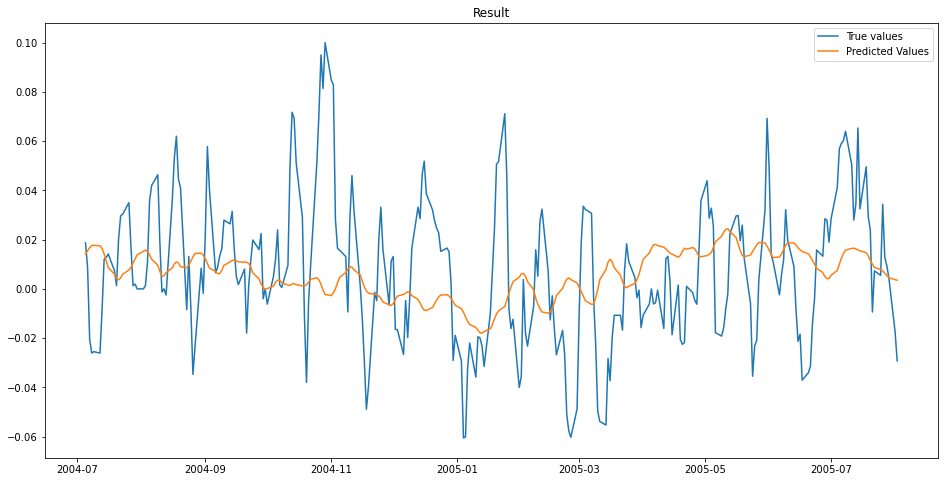


MSE: 0.000923271332531356

Iteration No: 78 ended. Search finished for the next optimal point.
Time taken: 11.1337
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 79 started. Searching for the next optimal point.

learning rate: 0.0024768316121782804
num_input_nodes: 166
dropout: 0.015770349364863216
sequence_length : 128
batch_size: 83



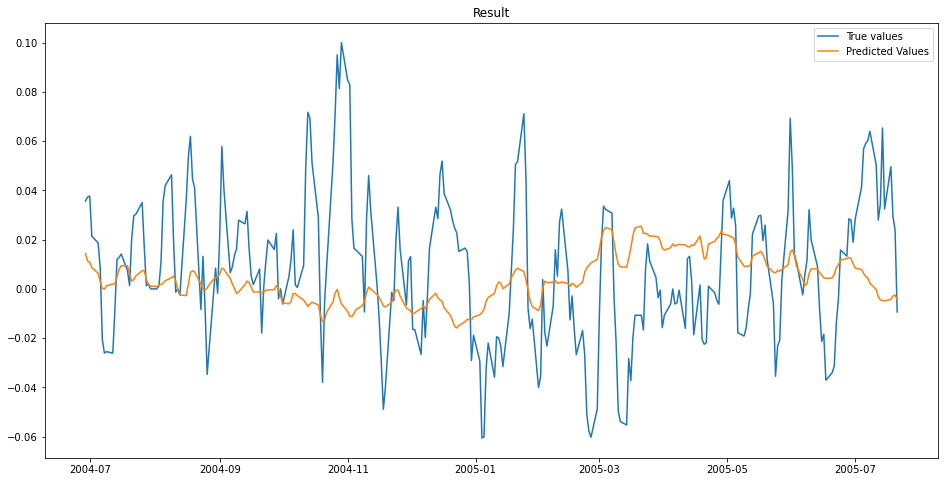


MSE: 0.0009983348784933053

Iteration No: 79 ended. Search finished for the next optimal point.
Time taken: 16.9210
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 80 started. Searching for the next optimal point.

learning rate: 0.0011848875333369338
num_input_nodes: 148
dropout: 0.1820547760128416
sequence_length : 186
batch_size: 112



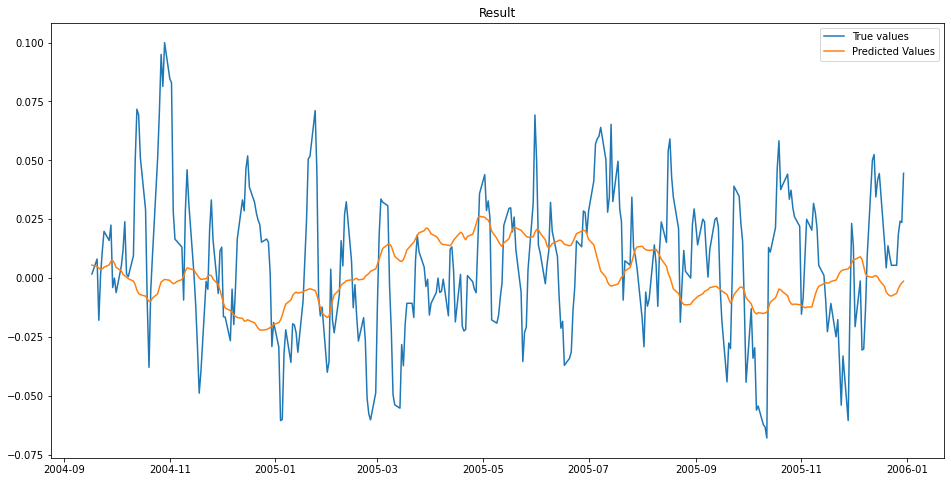


MSE: 0.0010663100337071098

Iteration No: 80 ended. Search finished for the next optimal point.
Time taken: 15.2390
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 81 started. Searching for the next optimal point.

learning rate: 0.004562579122604782
num_input_nodes: 102
dropout: 0.0
sequence_length : 153
batch_size: 63



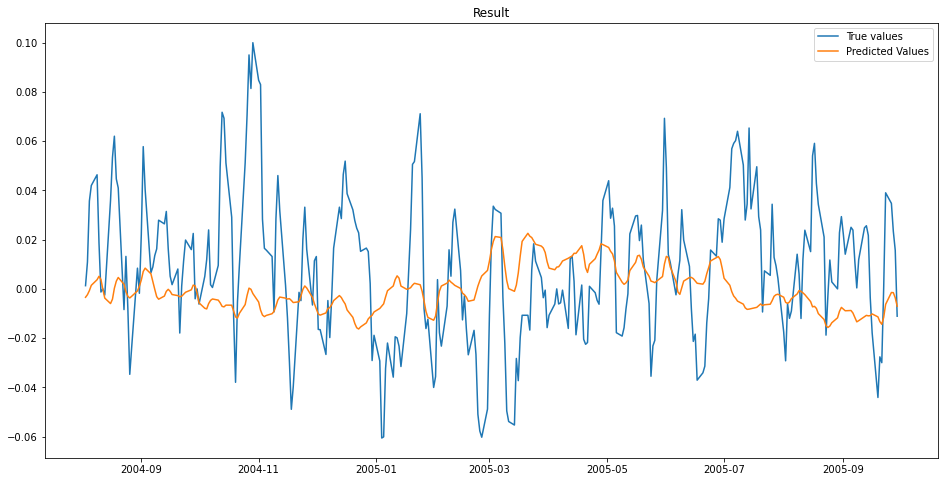


MSE: 0.001007437019329903

Iteration No: 81 ended. Search finished for the next optimal point.
Time taken: 16.7814
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 82 started. Searching for the next optimal point.

learning rate: 0.002827388517269168
num_input_nodes: 209
dropout: 0.17279149398322147
sequence_length : 117
batch_size: 247



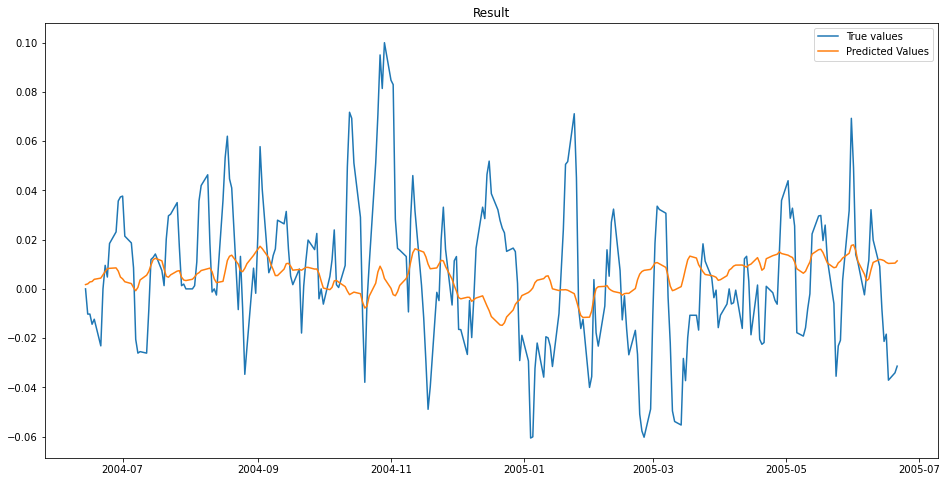


MSE: 0.000845270200012641

Iteration No: 82 ended. Search finished for the next optimal point.
Time taken: 12.5573
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 83 started. Searching for the next optimal point.

learning rate: 0.0010175461262211167
num_input_nodes: 159
dropout: 0.21268918654950092
sequence_length : 117
batch_size: 96



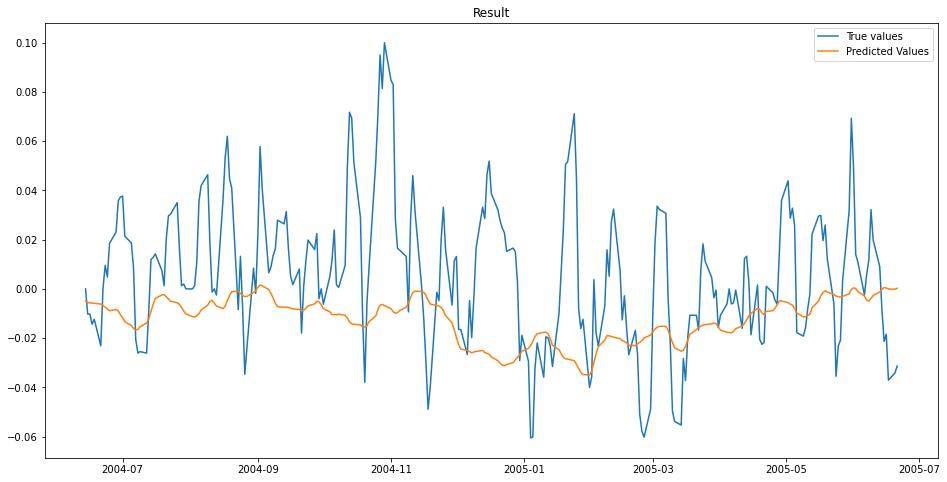


MSE: 0.0011356295754536465

Iteration No: 83 ended. Search finished for the next optimal point.
Time taken: 13.6321
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 84 started. Searching for the next optimal point.

learning rate: 0.0019620658397930023
num_input_nodes: 247
dropout: 0.0796603052293783
sequence_length : 141
batch_size: 82



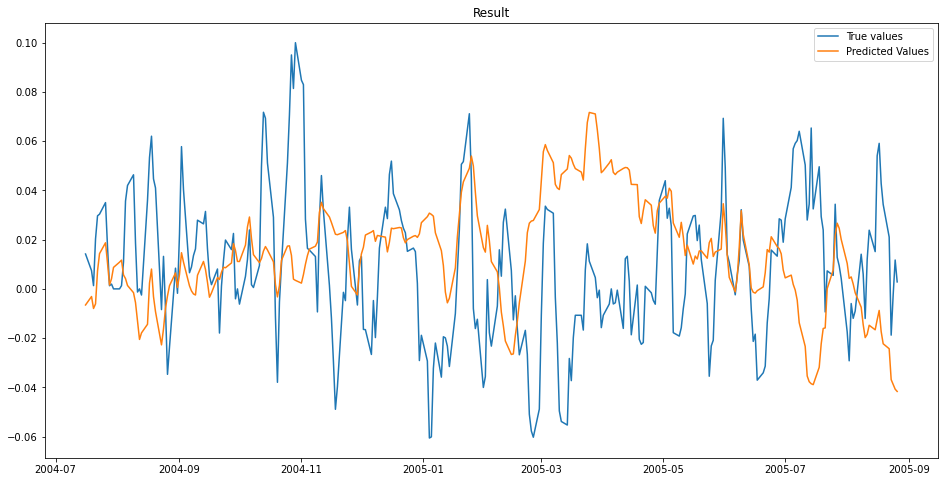


MSE: 0.0015668229253500386

Iteration No: 84 ended. Search finished for the next optimal point.
Time taken: 38.5708
Function value obtained: 0.0016
Current minimum: 0.0008
Iteration No: 85 started. Searching for the next optimal point.

learning rate: 0.008043191210903316
num_input_nodes: 42
dropout: 0.22844898929603968
sequence_length : 113
batch_size: 68



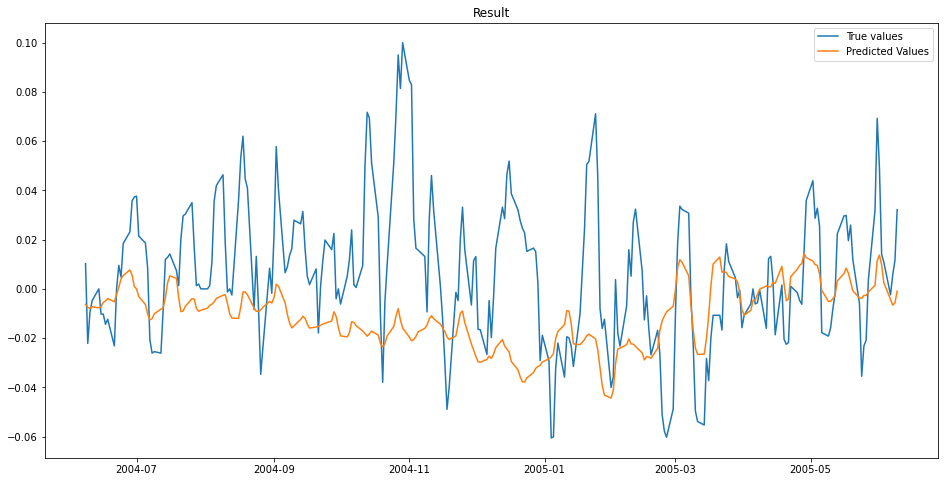


MSE: 0.0011402013612306903

Iteration No: 85 ended. Search finished for the next optimal point.
Time taken: 13.1614
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 86 started. Searching for the next optimal point.

learning rate: 0.0038009778724640993
num_input_nodes: 232
dropout: 0.12491961823757344
sequence_length : 136
batch_size: 71



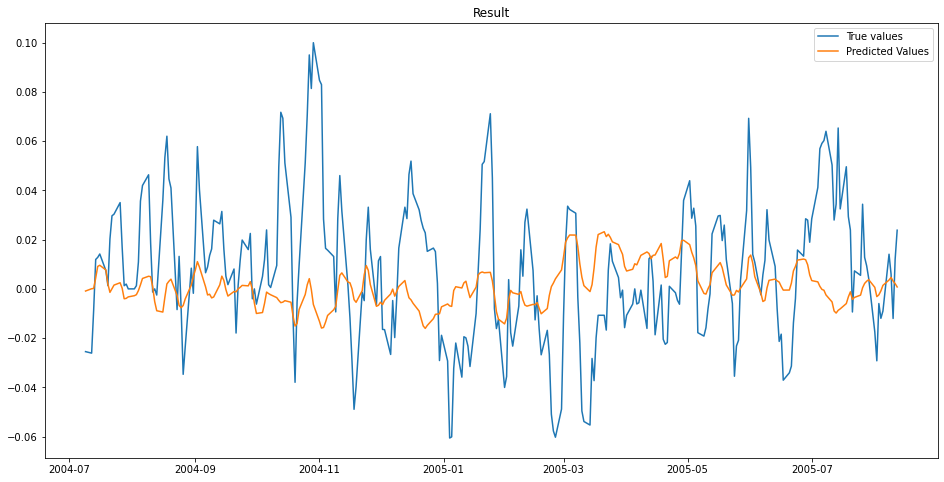


MSE: 0.0009350912536086909

Iteration No: 86 ended. Search finished for the next optimal point.
Time taken: 18.7766
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 87 started. Searching for the next optimal point.

learning rate: 0.005333059284877444
num_input_nodes: 28
dropout: 0.10729957267690465
sequence_length : 105
batch_size: 246



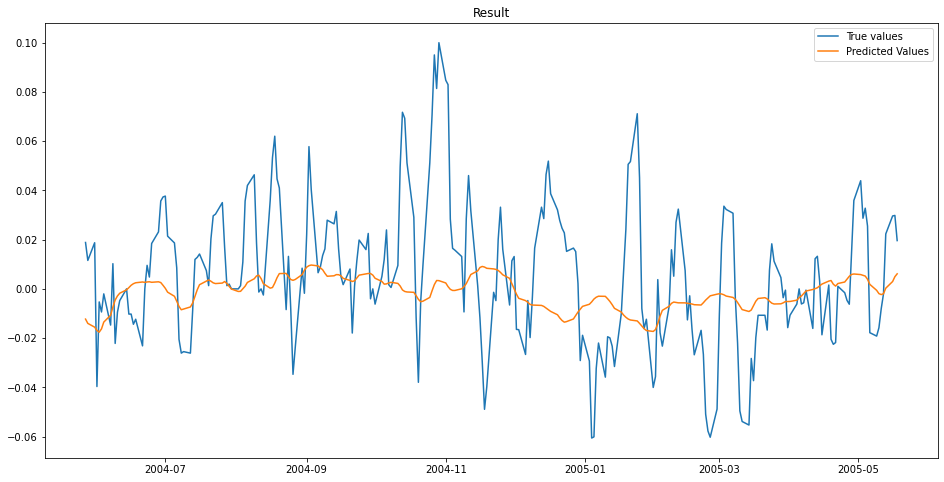


MSE: 0.000830501382589286

Iteration No: 87 ended. Search finished for the next optimal point.
Time taken: 10.2982
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 88 started. Searching for the next optimal point.

learning rate: 0.0001477443660864128
num_input_nodes: 152
dropout: 0.13384018712408904
sequence_length : 181
batch_size: 59



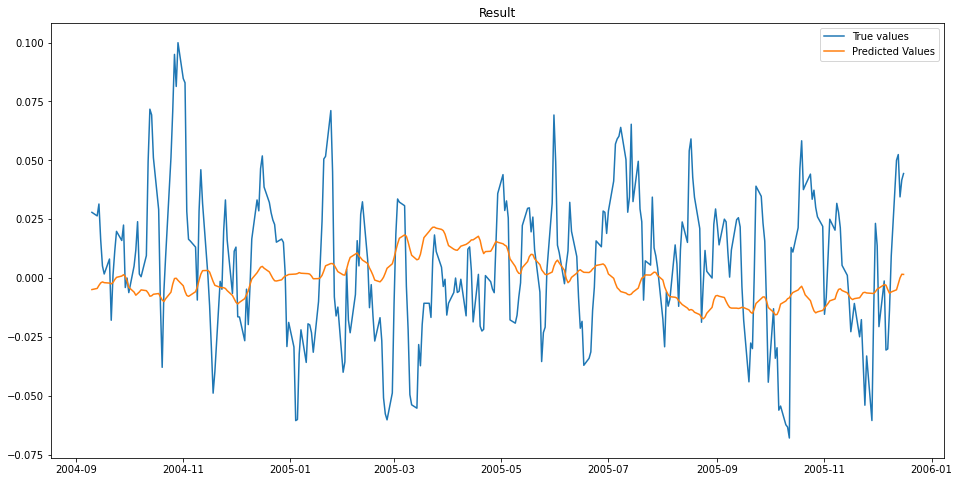


MSE: 0.0010742133742087374

Iteration No: 88 ended. Search finished for the next optimal point.
Time taken: 22.0793
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 89 started. Searching for the next optimal point.

learning rate: 0.0009464590991239712
num_input_nodes: 248
dropout: 0.10128721947996311
sequence_length : 138
batch_size: 21



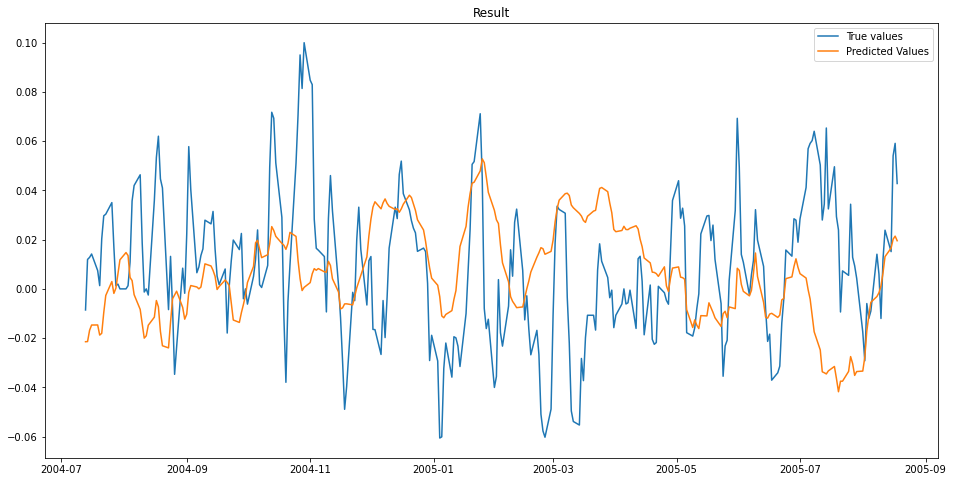


MSE: 0.0012577613908097056

Iteration No: 89 ended. Search finished for the next optimal point.
Time taken: 59.6731
Function value obtained: 0.0013
Current minimum: 0.0008
Iteration No: 90 started. Searching for the next optimal point.

learning rate: 0.003733473307491649
num_input_nodes: 106
dropout: 0.1397351285801814
sequence_length : 131
batch_size: 27



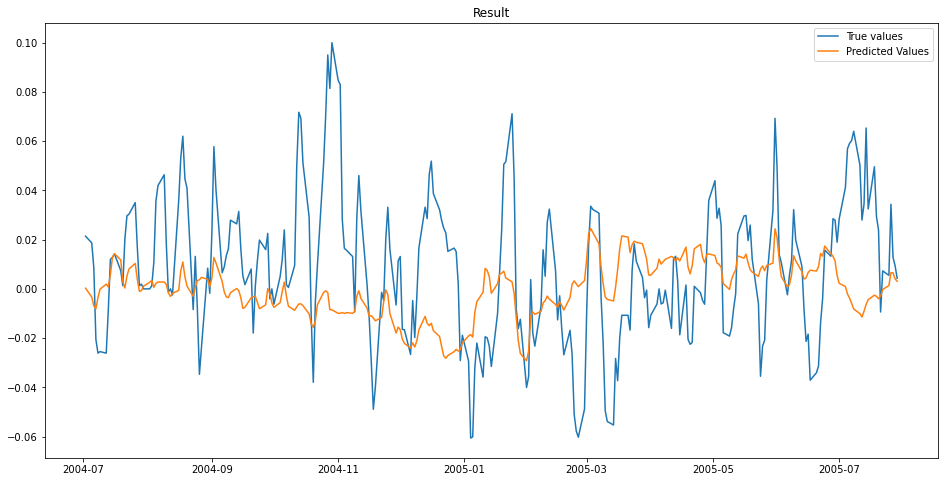


MSE: 0.0009918951026565935

Iteration No: 90 ended. Search finished for the next optimal point.
Time taken: 29.6713
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 91 started. Searching for the next optimal point.

learning rate: 0.00042512873769958527
num_input_nodes: 15
dropout: 0.19247185242395462
sequence_length : 114
batch_size: 172



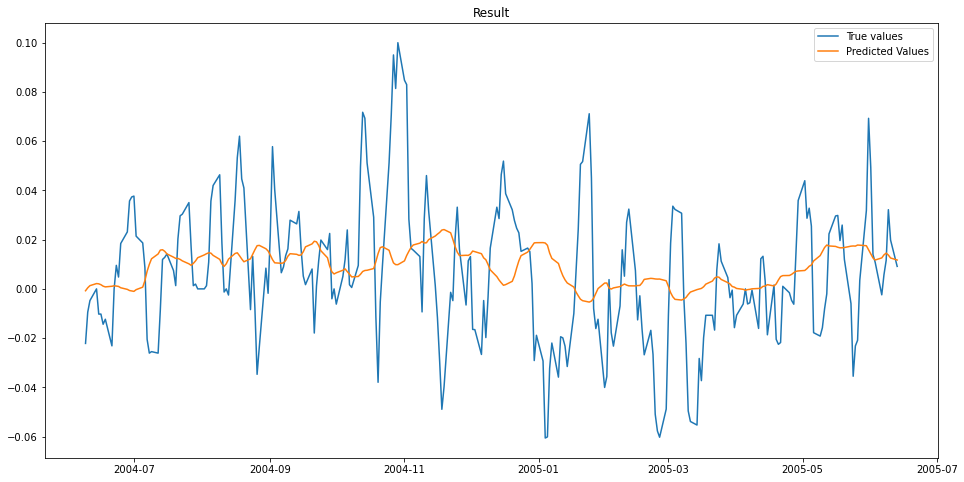


MSE: 0.0008563741580338226

Iteration No: 91 ended. Search finished for the next optimal point.
Time taken: 12.4956
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 92 started. Searching for the next optimal point.

learning rate: 0.001533104912679358
num_input_nodes: 68
dropout: 0.24807317532063117
sequence_length : 117
batch_size: 250



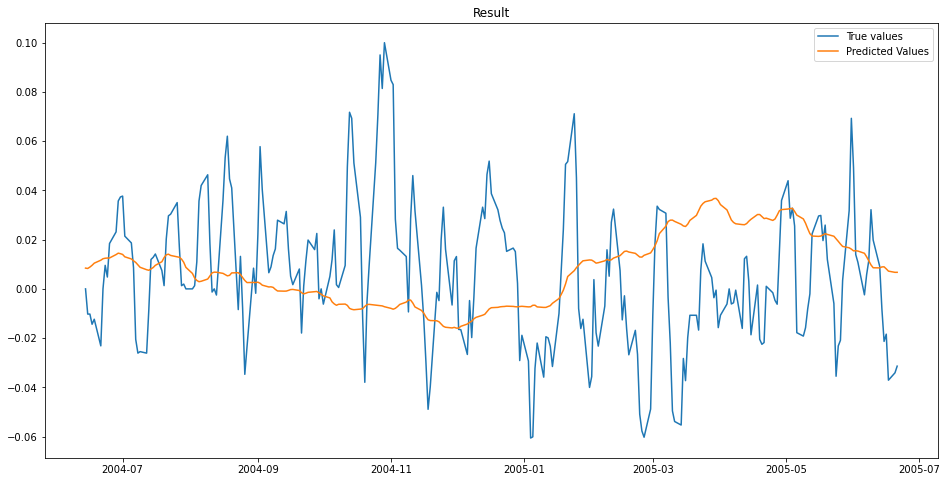


MSE: 0.0011546789313729663

Iteration No: 92 ended. Search finished for the next optimal point.
Time taken: 9.6489
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 93 started. Searching for the next optimal point.

learning rate: 0.001454010611221609
num_input_nodes: 52
dropout: 0.09308903147973126
sequence_length : 116
batch_size: 182



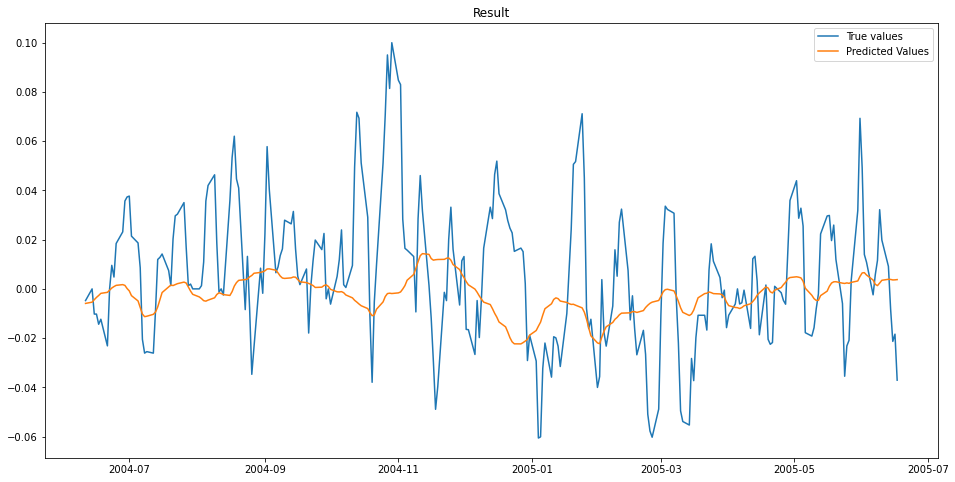


MSE: 0.000869055450219514

Iteration No: 93 ended. Search finished for the next optimal point.
Time taken: 10.4442
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 94 started. Searching for the next optimal point.

learning rate: 0.00013922483491784666
num_input_nodes: 57
dropout: 0.00809265959299685
sequence_length : 154
batch_size: 51



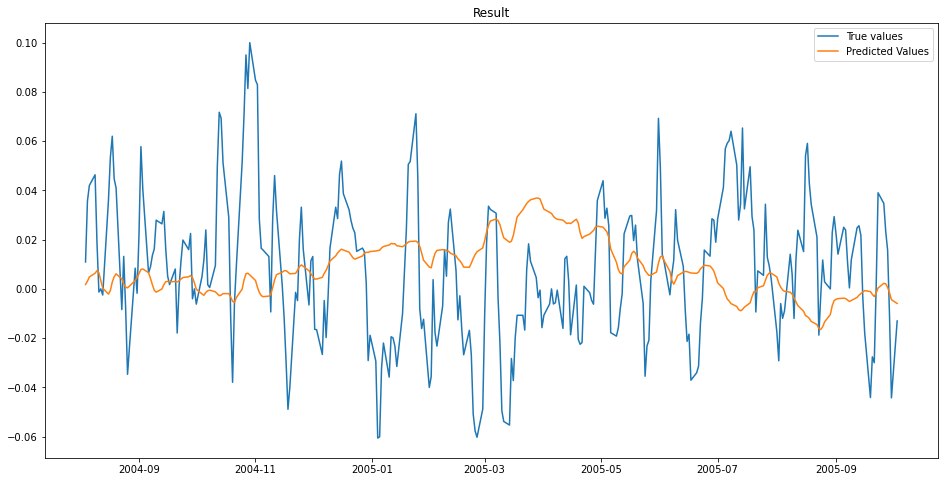


MSE: 0.0011237961888704996

Iteration No: 94 ended. Search finished for the next optimal point.
Time taken: 23.8975
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 95 started. Searching for the next optimal point.

learning rate: 0.0013059109236988422
num_input_nodes: 233
dropout: 0.23335334911415334
sequence_length : 115
batch_size: 250



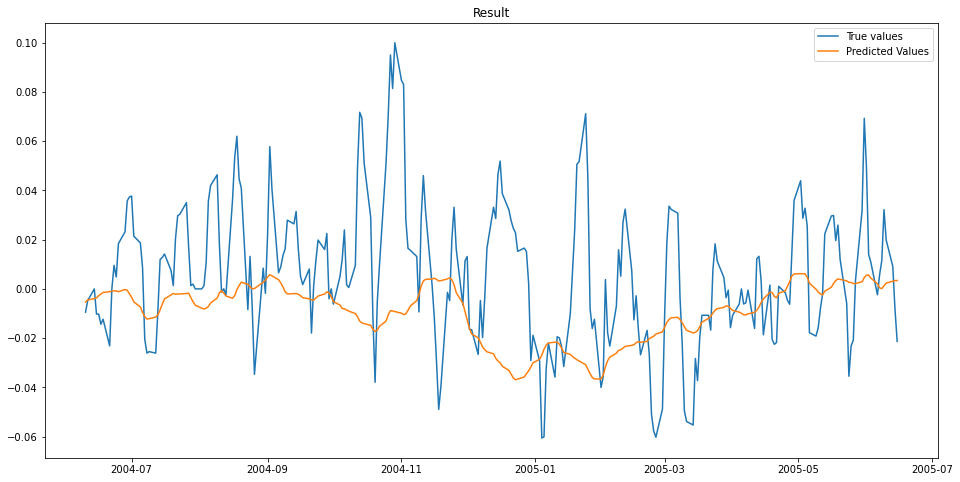


MSE: 0.001092466568995872

Iteration No: 95 ended. Search finished for the next optimal point.
Time taken: 13.4270
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 96 started. Searching for the next optimal point.

learning rate: 0.0012994117077752589
num_input_nodes: 233
dropout: 0.0722739160696772
sequence_length : 118
batch_size: 105



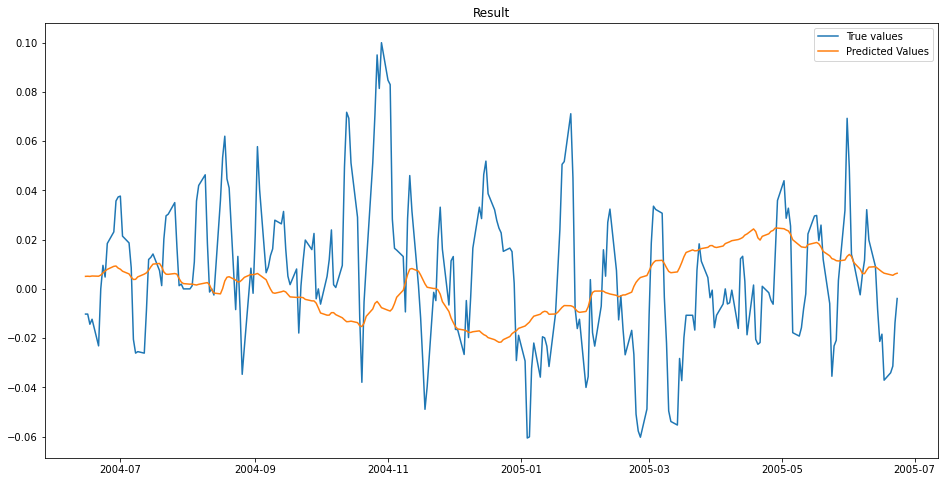


MSE: 0.0010284663761316673

Iteration No: 96 ended. Search finished for the next optimal point.
Time taken: 17.4291
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 97 started. Searching for the next optimal point.

learning rate: 0.0002890880806223456
num_input_nodes: 237
dropout: 0.12307850504510529
sequence_length : 160
batch_size: 232



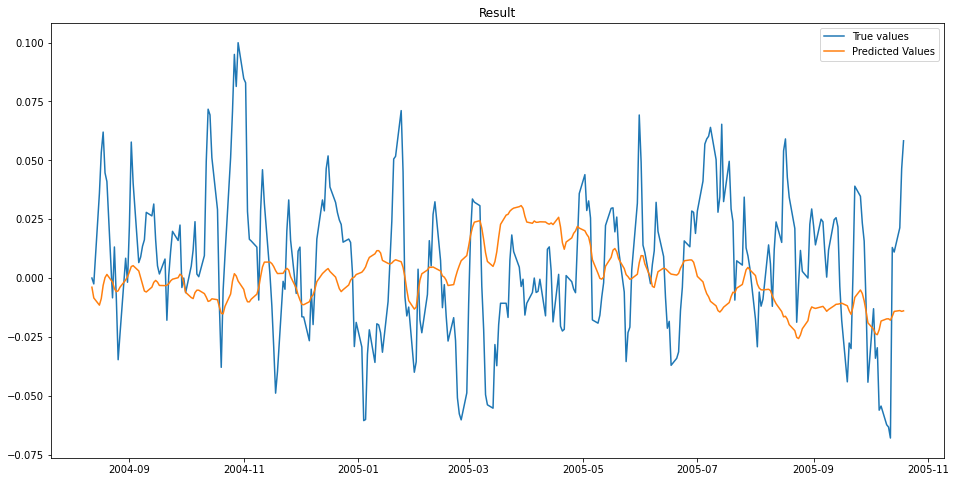


MSE: 0.0011479920124129253

Iteration No: 97 ended. Search finished for the next optimal point.
Time taken: 21.6333
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 98 started. Searching for the next optimal point.

learning rate: 0.0012577659122044397
num_input_nodes: 8
dropout: 0.109377184826278
sequence_length : 117
batch_size: 58



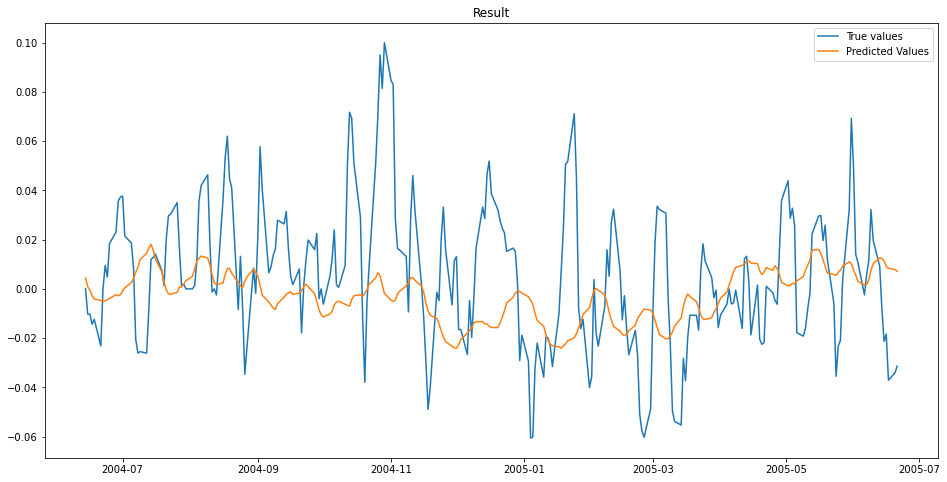


MSE: 0.0009506283771606547

Iteration No: 98 ended. Search finished for the next optimal point.
Time taken: 12.6152
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 99 started. Searching for the next optimal point.

learning rate: 0.006974747432123218
num_input_nodes: 41
dropout: 0.14900360209844157
sequence_length : 113
batch_size: 244



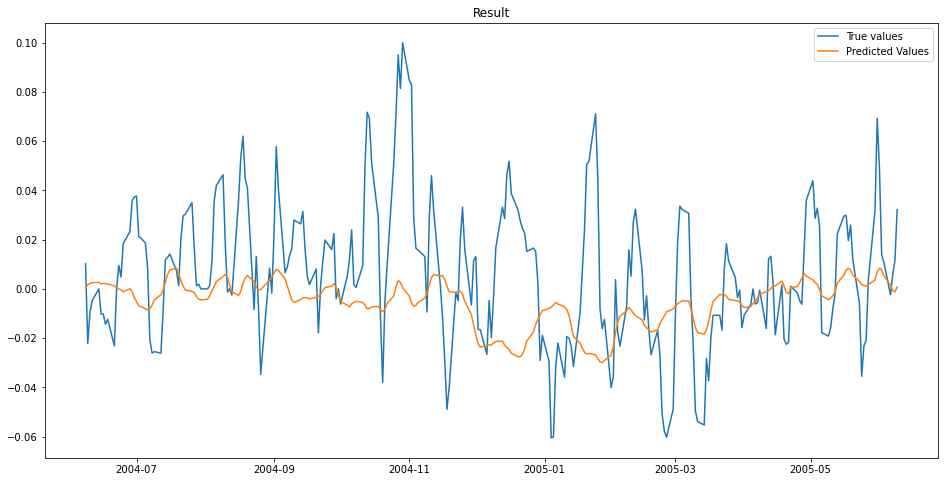


MSE: 0.0009569955632792673

Iteration No: 99 ended. Search finished for the next optimal point.
Time taken: 11.6618
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 100 started. Searching for the next optimal point.

learning rate: 0.00011721775002593032
num_input_nodes: 39
dropout: 0.12976722869907892
sequence_length : 174
batch_size: 136



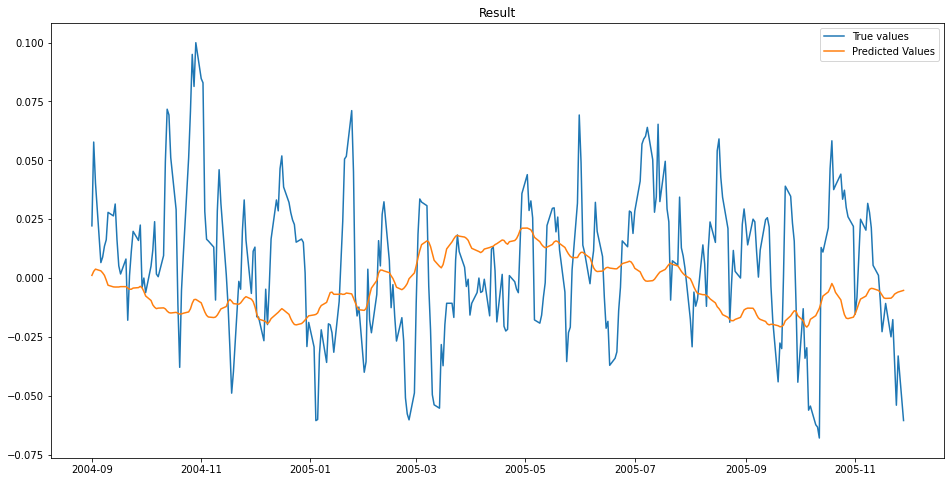


MSE: 0.0011511193980268085

Iteration No: 100 ended. Search finished for the next optimal point.
Time taken: 15.4446
Function value obtained: 0.0012
Current minimum: 0.0008


In [10]:
gp_result = gp_minimize(func=fitness,
                            dimensions=dimensions,
                            n_jobs=-1,
                            n_random_starts=10,
                            verbose=True,
                            x0=default_parameters,
                            random_state=randseed)

**Summary of configurations and results**

In [11]:
res = pd.concat([pd.DataFrame(gp_result.x_iters, columns = ['learning_rate', 'num_input_nodes', 'dropout', 'sequencelength', 'batch_size']),(pd.Series(gp_result.func_vals, name="mse"))], axis=1)
res = res.sort_values(by='mse')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(res)

,learning_rate,num_input_nodes,dropout,sequencelength,batch_size,mse
58,0.002539,248,0.175955,114,241,0.000800
17,0.010000,203,0.106406,118,2,0.000828
86,0.005333,28,0.107300,105,246,0.000831
81,0.002827,209,0.172791,117,247,0.000845
36,0.001464,12,0.237878,123,149,0.000852
24,0.000286,124,0.198719,112,17,0.000855
38,0.008511,6,0.051923,118,2,0.000856
90,0.000425,15,0.192472,114,172,0.000856
19,0.010000,213,0.248768,100,120,0.000860
9,0.001660,214,0.043341,139,46,0.000861
